### В данном ноутбуке выполнялся анализ и визуализация данных

#### Обзор состоит из 2 частей: в первой части приведен общий анализ аптечного сектора, во второй части проводится сравнительный анализ самых крупных аптечных сетей.

In [1]:
import sys
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
from tqdm.notebook import tqdm
import altair as alt

In [2]:
df_ph = pd.read_csv('df_ph.csv')

In [3]:
df_ph.head()

,name_of_medicine,dosage_form,type_of_good,active_ingredient,is_medicine,is_prescribed,name_of_manufacturer,country_of_manufaturer,is_import,retail_chain,name_of_pharmacy,city_of_pharmacy,price_of_medicine
0,Bionime Rightest GM 550,глюкометр N1,МТ,NaN,0,0,Бионайм ГмбХ,Швейцария,1,Inlek,InLek Аптека N25 ОДО ДКМ-ФАРМ,Гродно,19.43
1,Bionime Rightest GM 550 + 50 тест-полосок,глюкометр N1,МТ,NaN,0,0,Бионайм ГмбХ,Швейцария,1,Inlek,InLek Аптека N25 ОДО ДКМ-ФАРМ,Гродно,42.38
2,Beurer FT 09/1,термометр электронный N1,МТ,NaN,0,0,Бойрер Гмбх,Германия,1,Inlek,InLek Аптека N25 ОДО ДКМ-ФАРМ,Гродно,16.49
3,Beurer FT 90,термометр электронный ик N1,МТ,NaN,0,0,Бойрер Гмбх,Германия,1,Inlek,InLek Аптека N25 ОДО ДКМ-ФАРМ,Гродно,305.69
4,Beurer PO 30,пульсоксиметр N1,МТ,NaN,0,0,Бойрер Гмбх,Германия,1,Inlek,InLek Аптека N25 ОДО ДКМ-ФАРМ,Гродно,151.30


#### Для анализа по ценам необходима была их категоризация, для этого были построены следующие гистограммы:

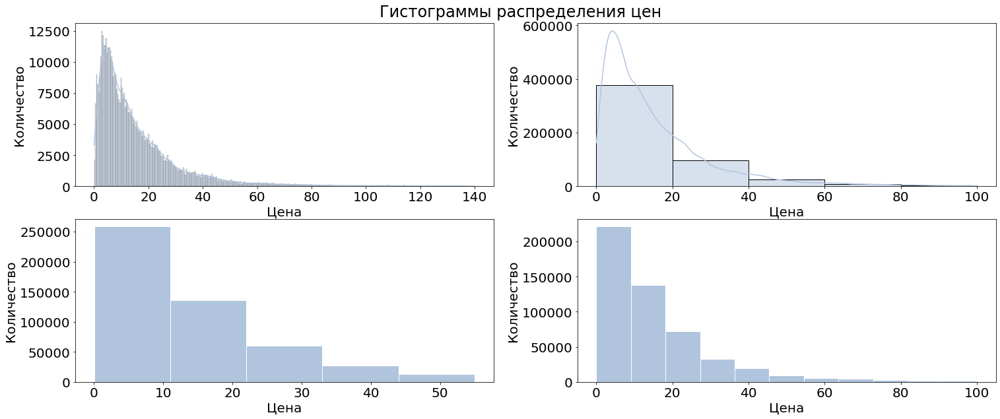

In [4]:
plt.rcParams.update({'font.size': 20})

fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(25,10))
fig.suptitle("Гистограммы распределения цен", y=0.92)
df_ph_temp = df_ph.loc[df_ph.price_of_medicine <= 140]

g = sns.histplot(data = df_ph_temp, x='price_of_medicine', kde=True, bins='auto',  color='lightsteelblue', ax=ax1[0])
g.set(xlabel='Цена', ylabel='Количество')

df_ph_temp = df_ph.loc[df_ph.price_of_medicine <= 100]

g = sns.histplot(data = df_ph_temp, x='price_of_medicine', kde=True, bins=5, color='lightsteelblue', ax=ax1[1])
g.set(xlabel='Цена', ylabel='Количество')


df_ph_temp = df_ph.loc[df_ph.price_of_medicine <= 100]
n1, bins1, patches1 = plt.hist(df_ph_temp.price_of_medicine, bins=11, facecolor = 'lightsteelblue', edgecolor='white')
plt.xlabel('Цена')
plt.ylabel('Количество')
plt.sca(ax2[0])

df_ph_temp = df_ph.loc[df_ph.price_of_medicine <= 55]
n2, bins2, patches2 = plt.hist(df_ph_temp.price_of_medicine, bins=5, facecolor = 'lightsteelblue', edgecolor='white')
plt.xlabel('Цена')
plt.ylabel('Количество')
plt.sca(ax2[1])

In [5]:
_, lowest_price_medicines, low_price_medicines, medium_price_medicines, high_price_medicines, highest_price_medicines = bins2

In [6]:
print(bins2)

[1.0000e-02 1.1008e+01 2.2006e+01 3.3004e+01 4.4002e+01 5.5000e+01]


In [7]:
[1.0000e-02, 1.1008e+01, 2.2006e+01, 3.3004e+01, 4.4002e+01, 5.5000e+01]

[0.01, 11.008, 22.006, 33.004, 44.002, 55.0]

#### Наиболее оптимальным образом, согласно распределению, которое имеет ненормальный характер, были определены следующие категории цен: низкая, ниже среднего, средняя, выше среднего, высокая, самая высокая.Им соответствуют следующие пороги цен: 0.01, 11.0, 22.0, 33.0, 44.0, 55.0.

In [8]:
def cat_of_price(price):
    if price > highest_price_medicines:
        return 'highest'
    elif high_price_medicines < price <= highest_price_medicines:
        return 'above_average'
    elif medium_price_medicines < price <= high_price_medicines:
        return 'average'
    elif low_price_medicines < price <= medium_price_medicines:
        return 'below_average'
    elif lowest_price_medicines < price <= low_price_medicines:
        return 'low'
    elif price <= lowest_price_medicines:
        return 'lowest'

In [9]:
df_ph['category_of_price'] = df_ph.price_of_medicine.apply(cat_of_price)
df_ph.category_of_price.unique()

array(['low', 'average', 'highest', 'below_average', 'lowest',
       'above_average'], dtype=object)

### Наиболее часто встречающиеся МНН

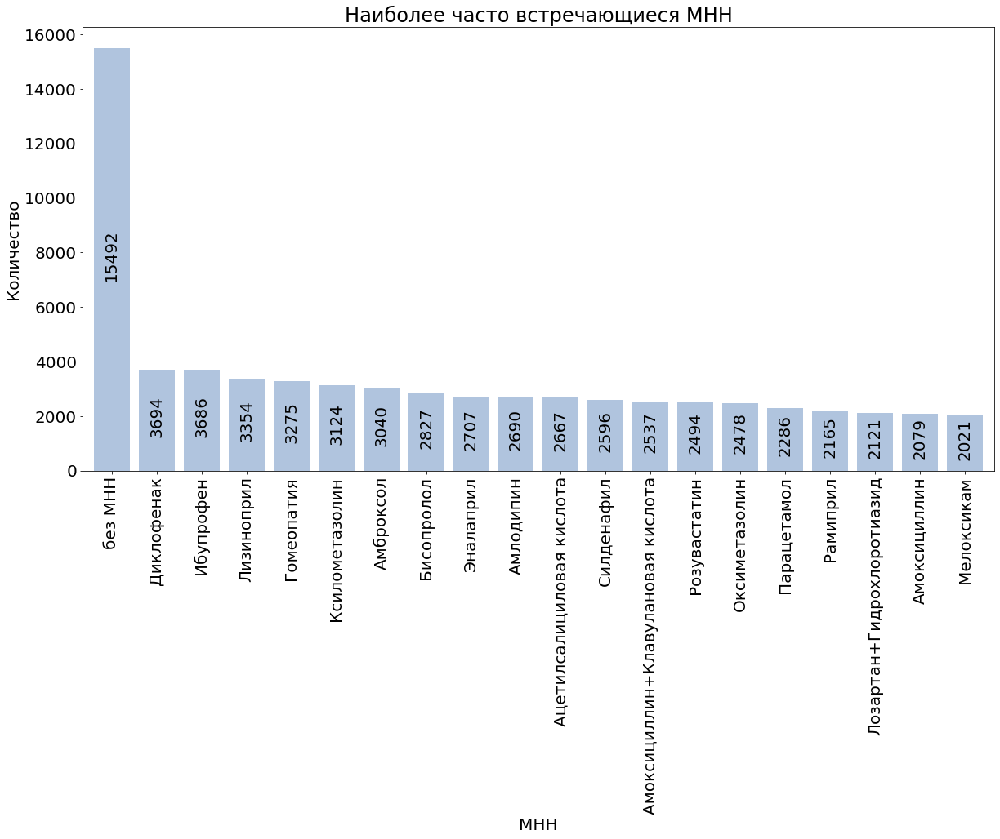

In [10]:
stat_of_mnn = df_ph[df_ph.is_medicine != 0].active_ingredient.value_counts().iloc[0:20]
fig = plt.figure(figsize=(20, 10))
ax = stat_of_mnn.plot.bar(title='Наиболее часто встречающиеся МНН', xlabel='МНН', ylabel='Количество', tick_label=stat_of_mnn.values, 
                          width=0.8, facecolor = 'lightsteelblue')
ax.bar_label(ax.containers[0], label_type='center', rotation=90, padding=5)
ax.margins(y=0.05)


#### Наиболее часто встречающимися МНН являются диклофенак, ибупрофен, лизиноприл, это объясняется тем, что лекарственные препараты с данными МНН представлены множеством лекарственных форм и производителей. 

#### Так как в группу «без МНН» входят все лекарственные препараты со сложным комбинированным составом, данная группа представлена шире всего на рынке, подобная ситуация с гомеопатическими лекарственными средствами.

In [11]:
# второй вариант наиболее популярных мнн в разрезе страны производства
# stat_of_mnn2 = df_ph[df_ph.is_medicine != 0].loc[:, ['active_ingredient', 'is_import']]
# stat_of_mnn2 = stat_of_mnn2[stat_of_mnn2['active_ingredient'].isin(stat_of_mnn.index)]


# groups = stat_of_mnn2.active_ingredient.value_counts().index.to_numpy()
# hue_type = stat_of_mnn2['is_import'].dtype.type
# proportions = stat_of_mnn2.groupby('active_ingredient')['is_import'].value_counts(normalize=True)
# proportions.loc['Гомеопатия', 0] = 0
# proportions.loc['Морская вода', 0] = 0

# fig = plt.figure(figsize=(25, 10))
# ax = sns.countplot(data=stat_of_mnn2, x='active_ingredient', hue='is_import', order=groups)
# ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
# ax.set_xlabel('МНН')
# ax.set_ylabel('Количество')
# ax.set_title('Наиболее популярные МНН в разрезе страны производства')
# ax.legend(['Беларусь','Импорт'], title='Производство', loc='best')

# for c in ax.containers:
#     labels = [f'{proportions.loc[g, hue_type(c.get_label())]:.1%}' for g in groups]
#     ax.bar_label(c, labels, rotation=90, padding = 5)
# ax.margins(y=0.2)

### Наиболее часто встречающиеся МННв разрезе страны производства

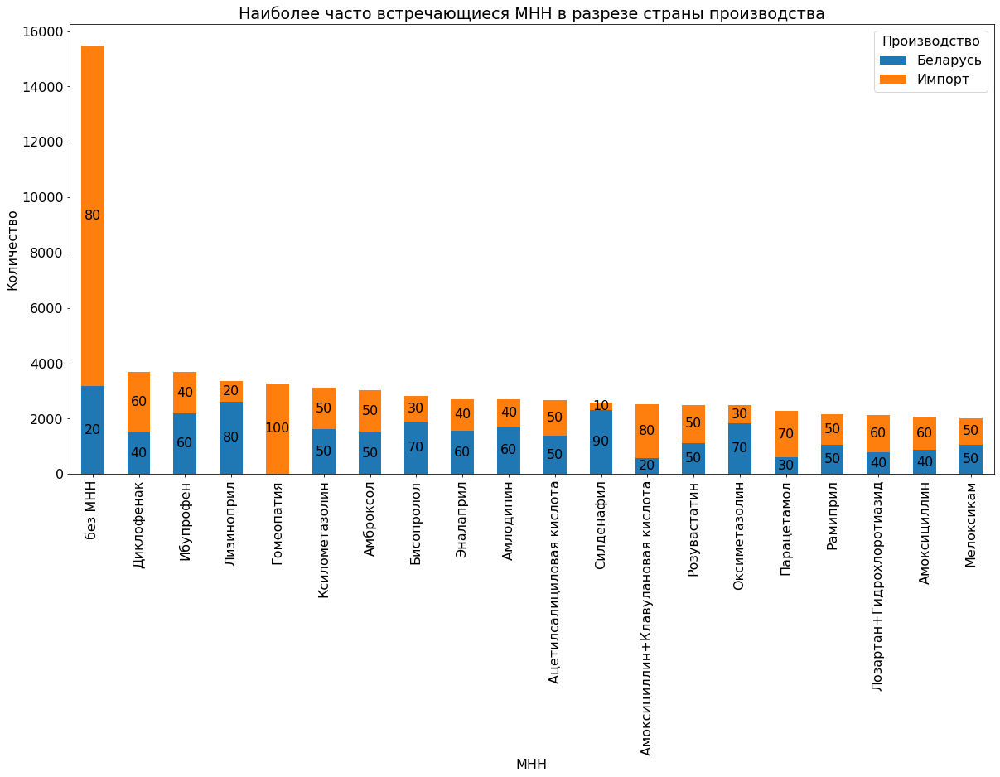

In [12]:
plt.rcParams.update({'font.size': 16})

stat_of_mnn2 = df_ph[df_ph.is_medicine != 0].loc[:, ['active_ingredient', 'is_import']]
stat_of_mnn2 = stat_of_mnn2[stat_of_mnn2['active_ingredient'].isin(stat_of_mnn.index)]
stat_of_mnn2_for_plot = stat_of_mnn2.groupby(['active_ingredient','is_import']).size().unstack()
stat_of_mnn2_for_plot = stat_of_mnn2.groupby(['active_ingredient','is_import']).size().unstack().sort_index(key=stat_of_mnn2_for_plot.sum(1).get, ascending=False)

groups = stat_of_mnn2.active_ingredient.value_counts().index.to_numpy()
hue_type = stat_of_mnn2['is_import'].dtype.type
proportions = stat_of_mnn2.groupby('active_ingredient')['is_import'].value_counts(normalize=True)
proportions.loc['Гомеопатия', 0] = 0

ax = stat_of_mnn2_for_plot.plot(kind='bar', stacked=True, figsize=(20, 10))
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_xlabel('МНН')
ax.set_ylabel('Количество')
ax.set_title('Наиболее часто встречающиеся МНН в разрезе страны производства')
ax.legend(['Беларусь','Импорт'], title='Производство', loc='best')

for c in ax.containers:
    labels = [f'{proportions.loc[g, hue_type(c.get_label())]:.1}' for g in groups]
    labels = [int(float(i) * 100) if float(i) > 0 else '' for i  in labels]
    ax.bar_label(c, labels, label_type='center')

#### На данной столбчатой диаграмме можно понять, какие препараты и какой производитель (Беларусь, Импорт) чаще всего встречаются на рынке. 

#### Так, например, лекарственные средства со сложным комбинированным составом чаще всего завозятся в Беларусь из других стран. Ибупрофен, Лизиноприл, Бисопролол, Силденафил и другие чаще всего производятся в нашей стране. 

#### Многие ЛС (Ксилометазолин, Амброксол) встречаются примерно с той же частотой, что и белорусские. Гомеопатические лекарственные средства белорусского производства не встречаются на рынке.

### Наиболее часто встречающиеся МНН в виде WordCloud

(-0.5, 1999.5, 999.5, -0.5)

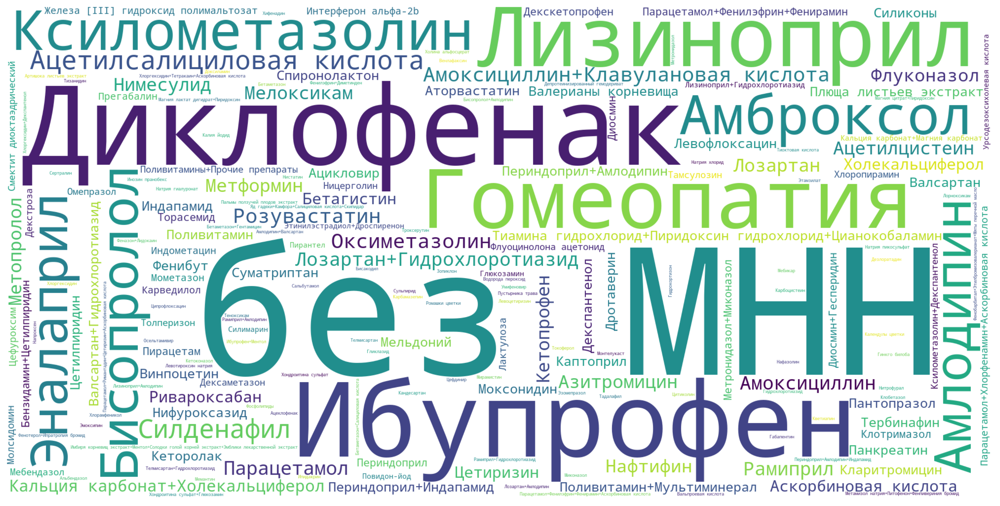

In [13]:
from matplotlib.colors import LinearSegmentedColormap
from collections import Counter
from wordcloud import WordCloud
from wordcloud import get_single_color_func

dictionary=Counter(df_ph[df_ph.is_medicine != 0].active_ingredient.to_numpy())
wc = WordCloud(background_color="white", width=2000, height=1000)
wc.generate_from_frequencies(dictionary)
plt.figure(figsize=(20,10), dpi=200)
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")

### Наиболее часто встречающиеся торговые названия

(-0.5, 799.5, 799.5, -0.5)

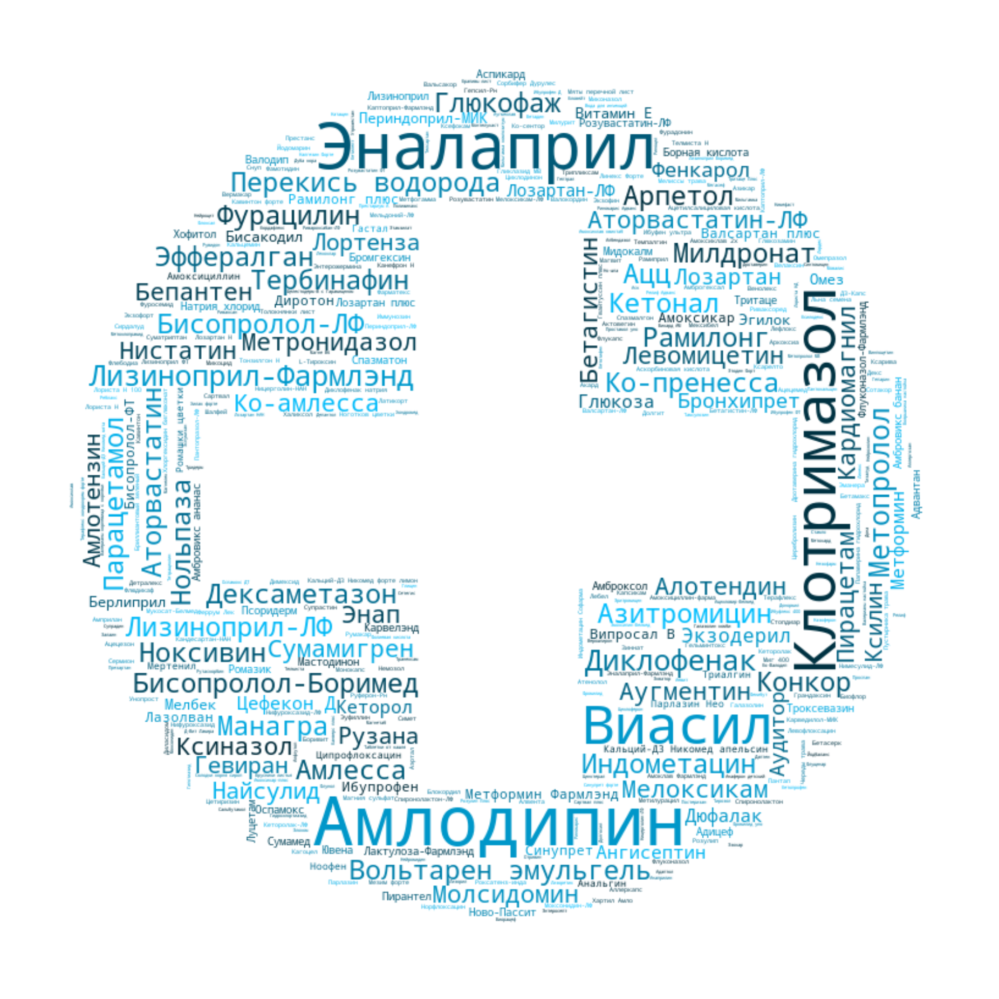

In [14]:
from PIL import Image

color_func = get_single_color_func('deepskyblue')
med_mask = np.array(Image.open("plus_sympol.jpg"))
dictionary=Counter(df_ph[df_ph.is_medicine != 0].name_of_medicine.to_numpy())

colors = ["#000000", "#111111", "#101010", "#121212", "#212121", "#222222"]
cmap = LinearSegmentedColormap.from_list("mycmap", colors)

wc = WordCloud(background_color="white", mask=med_mask, colormap=cmap, width=2000, height=1000, max_words=1000, color_func=color_func)
wc.generate_from_frequencies(dictionary)
plt.figure(figsize=(16,12), dpi=200)
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")

####  Некоторые препараты такие как Виасил, Эналаприл, Клотримазол встречаются чаще всего в аптеках так как бывают в многочисленных формах выпуска.

#### Eсли представить, что каждое торговое название бывает только в одной форме выпуске, то получится следующая визуализация:

(-0.5, 799.5, 799.5, -0.5)

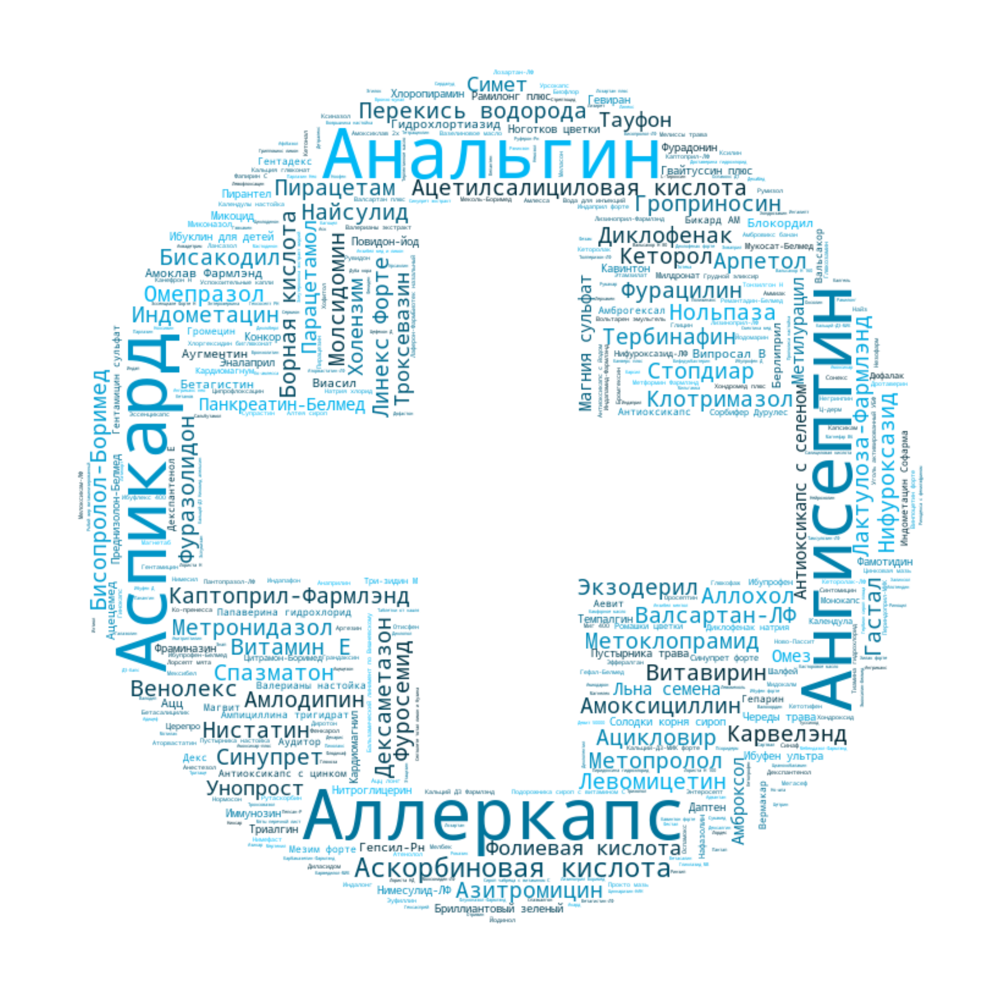

In [15]:
# торговые названия скорректированные по форме выпуска (только одно название в аптеке среди разных форм выпуска)

med_mask = np.array(Image.open("plus_sympol.jpg"))
dictionary=Counter(df_ph[df_ph.is_medicine != 0].groupby('name_of_pharmacy').aggregate({'name_of_medicine': 'unique'}).\
    reset_index().explode('name_of_medicine').name_of_medicine.to_numpy())

colors = ["#000000", "#111111", "#101010", "#121212", "#212121", "#222222"]
cmap = LinearSegmentedColormap.from_list("mycmap", colors)

wc = WordCloud(background_color="white", mask=med_mask, colormap=cmap, width=2000, height=1000, max_words=1000, color_func=color_func)
wc.generate_from_frequencies(dictionary)
plt.figure(figsize=(16,12), dpi=200)
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")


#### Так, наиболее часто встречающимися препаратами являются Аспикард, Анальгин, Аллеркапс и другие. Неудивительно, что наиболее часто встречающимися препаратами являются препараты, которые находятся в перечнях обязательного наличия. 
#### При этом некоторых препаратов из обязательных перечней может не присутствовать на визуализации так как не всегда аптеки показывают их наличие в открытом доступе, особенно это актуально для дефицитных препаратов с определенными торговыми названиями и формами выпуска.

### Наиболее редко встречающиеся препараты (меньше 10)

(-0.5, 1999.5, 999.5, -0.5)

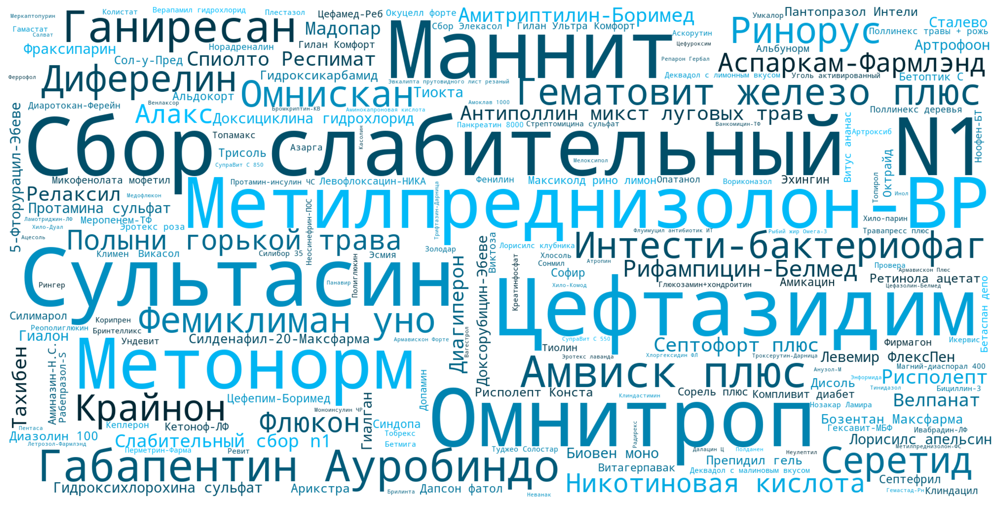

In [16]:
rare_medicines = df_ph.loc[df_ph.is_medicine == 1, 'name_of_medicine'].value_counts().sort_values(ascending=True)[0:200].to_dict()
for k, v in zip(rare_medicines.keys(), sorted(rare_medicines.values(), reverse=True)):
    rare_medicines[k] = v
    
wc = WordCloud(background_color="white", width=2000, height=1000, max_words=500, relative_scaling=0.5, color_func=color_func)
wc.generate_from_frequencies(rare_medicines)

plt.figure(figsize=(20,10), dpi=200)
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")

#### Чем больше размер шрифта, тем данный ЛП реже встречается в аптеках.

#### Так, на визуализации видно, что наиболее редкими являются препараты преимущественно стационарного назначения или те препараты, которые уходят с рынка.

### Аптечные сети с наиболее редко встречающимися препаратами

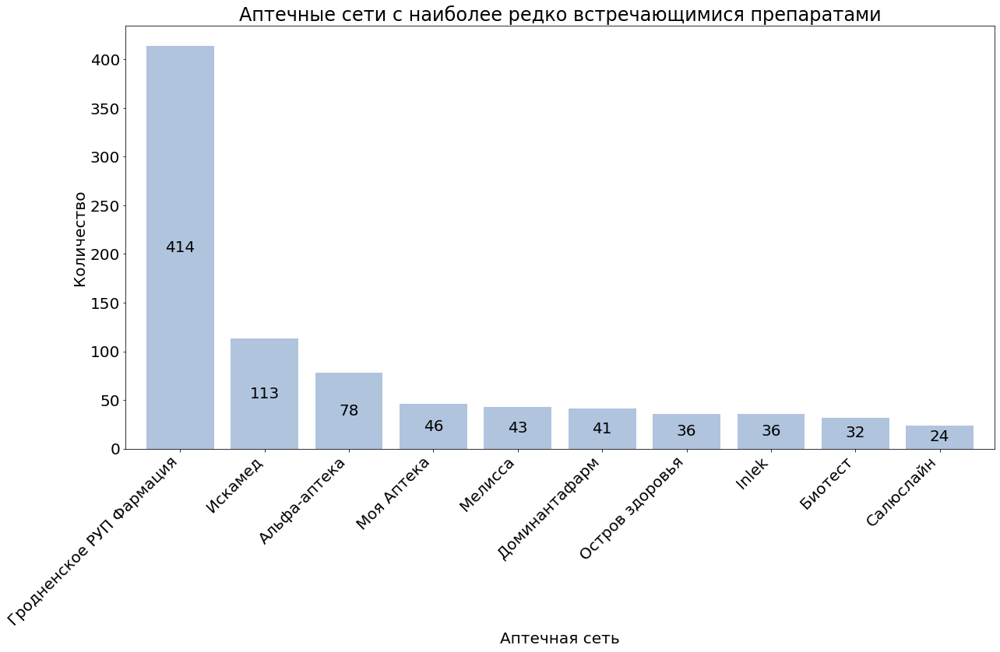

In [17]:
stat_of_rare_medicines = df_ph.loc[df_ph.name_of_medicine.isin(rare_medicines), 'retail_chain'].value_counts()[0:10]
plt.rcParams.update({'font.size': 20})
fig = plt.figure(figsize=(20, 10))

ax = stat_of_rare_medicines.plot.bar(title='Аптечные сети с наиболее редко встречающимися препаратами', xlabel='Аптечная сеть', ylabel='Количество', 
                                     tick_label=stat_of_rare_medicines.values, width=0.8, facecolor = 'lightsteelblue')
ax.set_xticklabels(stat_of_rare_medicines.index, rotation=45, ha='right')
ax.bar_label(ax.containers[0], label_type='center')
ax.margins(y=0.05)

#### «Редкие препараты» чаще всего встречаются в аптечной сети Гродненское РУП «Фармация», что неудивительно, так как это самая большая аптечная сеть города и в ней чаще всего можно встретить препараты стационарного отпуска. 
#### Кроме этого, аптечными сетями, у которых чаще других встречаются редкие препараты, являются Искамед и Альфа-аптека.

### Наиболее популярные лекарственные формы

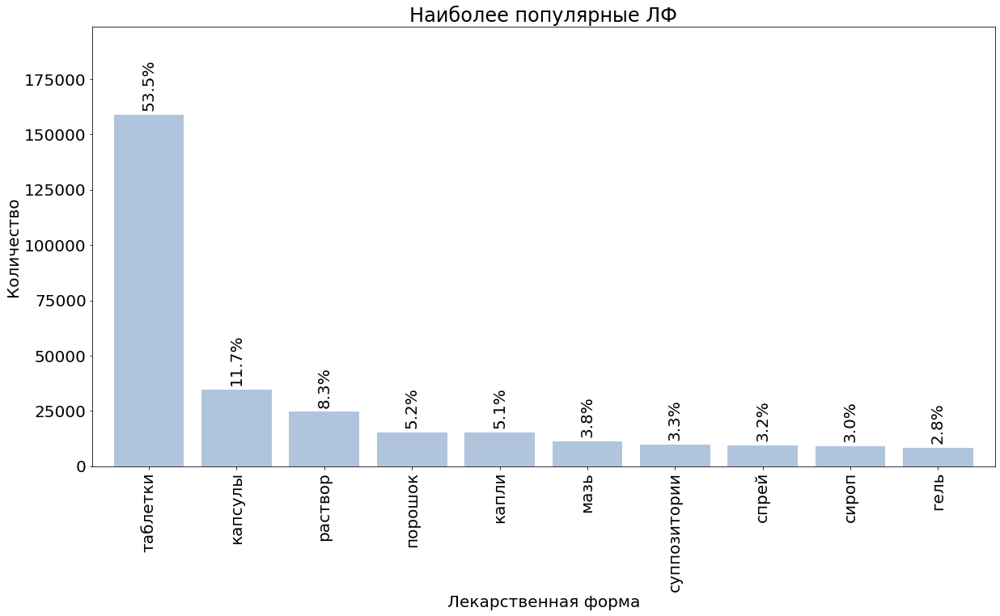

In [18]:
stat_of_lf = df_ph[df_ph.is_medicine != 0].dosage_form.str.split().apply(lambda x: x[0]).value_counts().iloc[0:10]

proportions = (stat_of_lf.values / stat_of_lf.sum())
labels = [f'{i * 100:.1f}%' for i in proportions]

fig = plt.figure(figsize=(20, 10))
ax = stat_of_lf.plot.bar(title='Наиболее популярные ЛФ', xlabel='Лекарственная форма', ylabel='Количество', 
                         tick_label=stat_of_lf.values, width=0.8, facecolor = 'lightsteelblue')
ax.bar_label(ax.containers[0], labels, label_type='edge', rotation=90, padding=5)
ax.margins(y=0.25)

#### Наиболее представленными лекарственными формами на рынке являются таблетки, доля которых составляет больше 50% среди всех лекарственных форм. По встречаемости после таблеток идут капсулы, растворы(для инъекций и наружного применения), порошки, капли.

### Наиболее часто встречающиеся производители

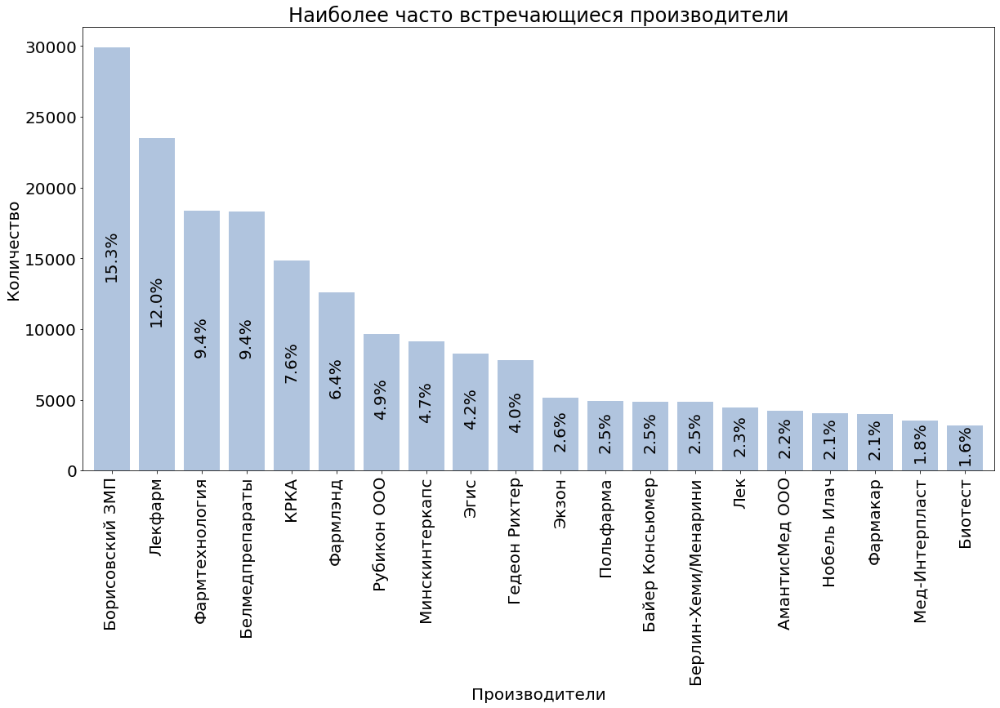

In [19]:
stat_of_manufacturer = df_ph[df_ph.is_medicine != 0].name_of_manufacturer.value_counts().iloc[0:20]

proportions = stat_of_manufacturer.values / stat_of_manufacturer.sum()
labels = [f'{i * 100:.1f}%' for i in proportions]

fig = plt.figure(figsize=(20, 10))
ax = stat_of_manufacturer.plot.bar(title='Наиболее часто встречающиеся производители', xlabel='Производители', ylabel='Количество', 
                          tick_label=stat_of_manufacturer.values, width=0.8, facecolor = 'lightsteelblue')
ax.bar_label(ax.containers[0], labels, label_type='center', rotation=90, padding=5)
ax.margins(y=0.05)

#### Чаще других в аптеках представлены лекарственные препараты Борисовского завода медицинских препаратов, следующими идут Лекфарм и Фармтехнология. 
#### Наиболее часто встречающимися лекарственными препаратами зарубежного производства являются ЛП произведенные КРКА.

## Для проведения сравнительного анализа аптечных сетей сначала было необходимо выяснить наиболее крупные аптечные сети.

### Общее количество аптек аптечной сети в городе Гродно и его окрестностях

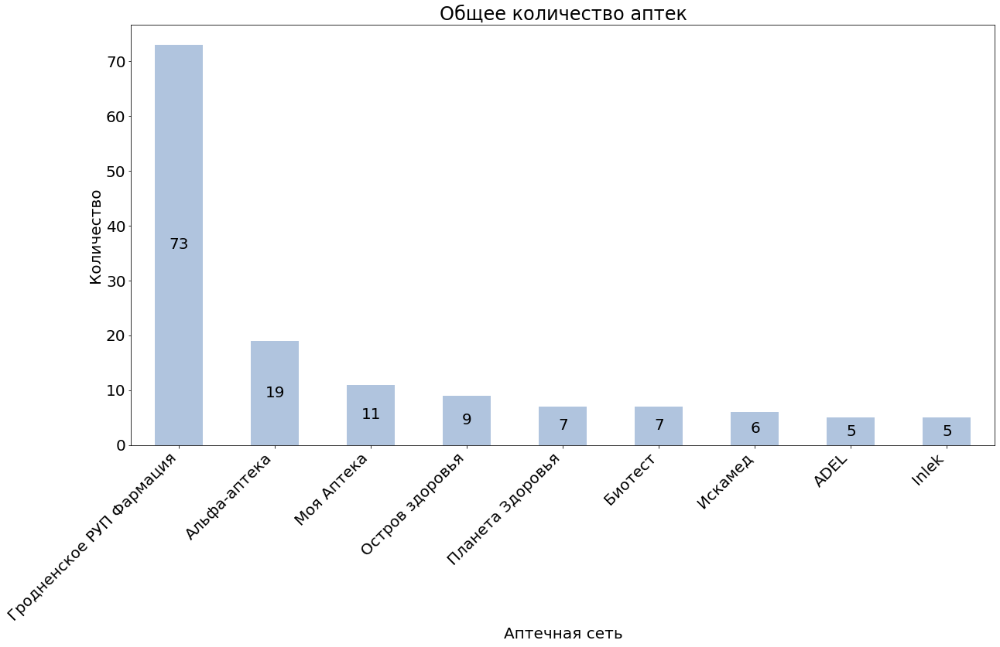

In [20]:
chain_and_uniq_pharm = df_ph.groupby(['retail_chain']).aggregate({'name_of_pharmacy' : 'unique'}).\
    name_of_pharmacy.apply(len).sort_values(ascending=False).iloc[0:9]

fig = plt.figure(figsize=(20, 10))
ax = chain_and_uniq_pharm.plot.bar(title='Общее количество аптек', xlabel='Аптечная сеть', ylabel='Количество', facecolor = 'lightsteelblue')
ax.bar_label(ax.containers[0], label_type='center')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.margins(y=0.05)

### Общее количество товарных позиций по аптечным сетям

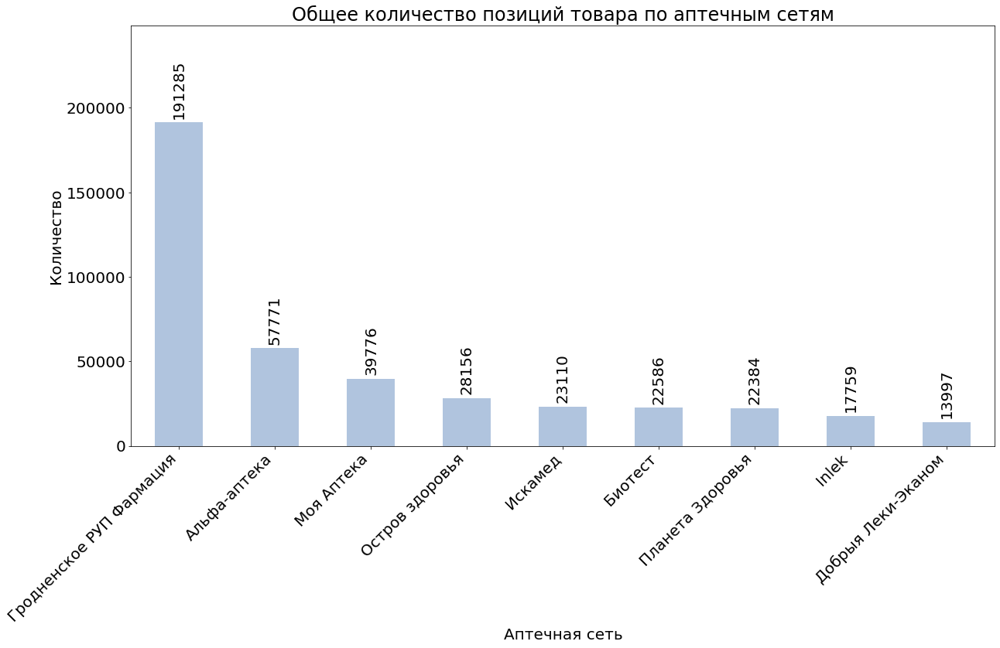

In [21]:
fig = plt.figure(figsize=(20, 10))
ax = df_ph.groupby('retail_chain').name_of_medicine.count().sort_values(ascending=False).\
    iloc[0:9,].plot.bar(title='Общее количество позиций товара по аптечным сетям', xlabel='Аптечная сеть', ylabel='Количество', facecolor = 'lightsteelblue')
ax.bar_label(ax.containers[0], label_type='edge', rotation=90, padding=5)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.margins(y=0.3)

### На основании данных, для последующего анализа было решено взять следующие аптечные сети: Гродненское РУП «Фармация», Альфа-аптека, Моя Аптека, Остров здоровья, Планета Здоровья, Биотест, Искамед, ADEL, Inlek.

In [22]:
list_of_top_pharmacies = df_ph.groupby(['retail_chain']).aggregate({'name_of_pharmacy' : 'unique'}).name_of_pharmacy.apply(len).sort_values(ascending=False).iloc[0:9].index.to_numpy()
list_of_top_pharmacies

array(['Гродненское РУП Фармация', 'Альфа-аптека', 'Моя Аптека',
       'Остров здоровья', 'Планета Здоровья', 'Биотест', 'Искамед',
       'ADEL', 'Inlek'], dtype=object)

### Соотношение различных товарных групп аптечных сетей в виде pie plot

In [23]:
df_for_pie = df_ph[['name_of_medicine', 'retail_chain', 'type_of_good']]
df_for_pie = df_for_pie[df_for_pie['type_of_good'].notnull()].copy()
df_for_pie.loc[(df_for_pie.type_of_good.isin(['Средства для полости рта', 'Интимные товары', 'Товары для детей', 'Товары для женщин', 'Продукты питания', 'Дезсредства', 'Другое'])), ['type_of_good']] = 'Остальное'

In [24]:
group_chain_and_category = df_for_pie[df_for_pie.type_of_good.isin(['ЛП', 'БАД', 'ИМН', 'МТ', 'Косметика', 'Остальное'])].groupby(['retail_chain', 'type_of_good']).aggregate({'name_of_medicine' : 'count'}) # для обычного pie
group_chain_and_category_main = df_ph[df_ph.type_of_good.isin(['ЛП', 'БАД', 'ИМН', 'МТ', 'Косметика'])].groupby(['retail_chain', 'type_of_good']).aggregate({'name_of_medicine' : 'count'}) # для nested pie
group_chain_and_category_other = df_ph[df_ph.type_of_good.isin(['Средства для полости рта', 'Интимные товары', 'Товары для детей', 'Товары для женщин', 'Продукты питания', 'Дезсредства', 'Другое'])].groupby(['retail_chain', 'type_of_good']).aggregate({'name_of_medicine' : 'count'})
group_chain_all = df_ph.groupby(['retail_chain', 'type_of_good']).aggregate({'name_of_medicine' : 'count'})

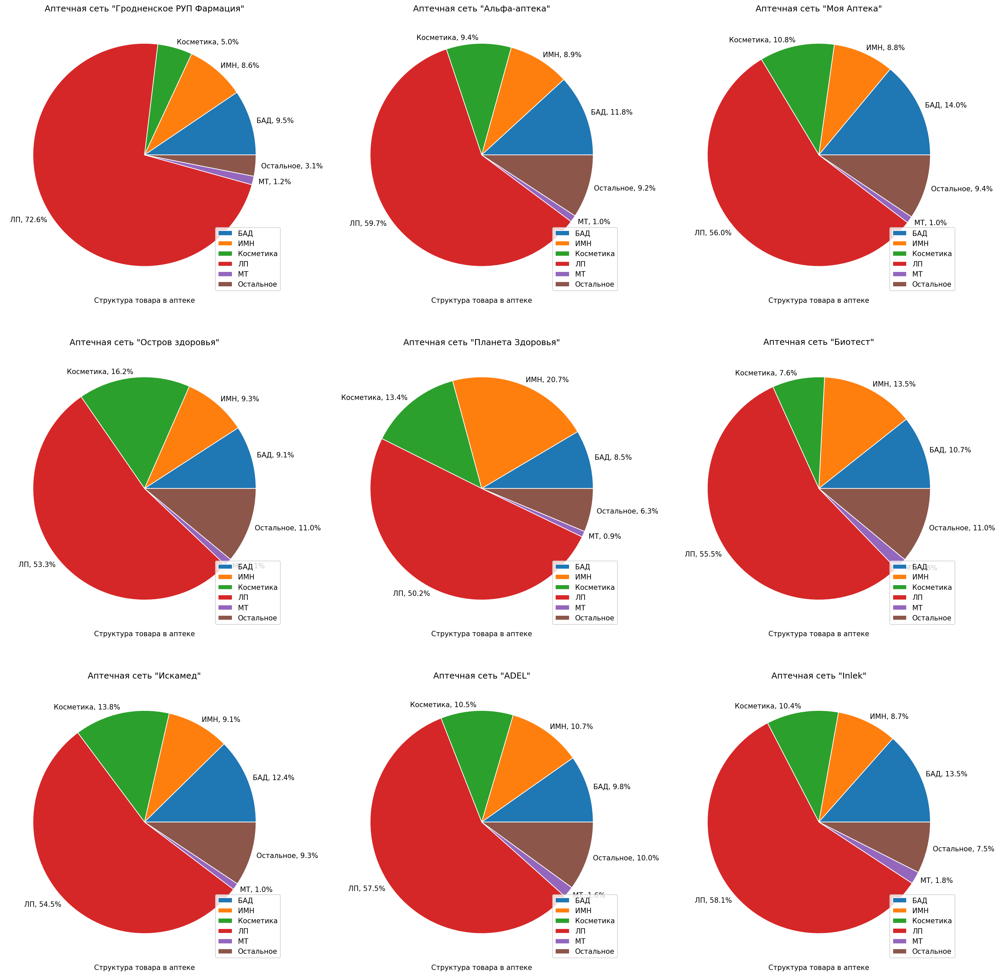

In [25]:
# основные товары

plt.rcParams.update({'font.size': 10})

#  Categorical Data
a = 3  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(20,20), dpi=150)

for i in list_of_top_pharmacies:
    x = group_chain_and_category.loc[i].values.flatten()
    labels_without_prct = group_chain_and_category.loc[i].index
    size = int(group_chain_and_category.loc[i].sum().values)
    sizes = [s/size * 100 for s in x]
    labels = [f'{l}, {s:0.1f}%' for l, s in zip(labels_without_prct, sizes)]
    
    ax = plt.subplot(a, b, c)
    x = group_chain_and_category.loc[i].to_numpy().flatten()
    x_index = group_chain_and_category.loc[i].index
    plt.pie(x, labels = labels, labeldistance=1.05,  wedgeprops={"edgecolor":"w",'linewidth': 1, 'linestyle': 'solid', 'antialiased': True}, textprops={'fontsize': 10}, normalize=True)
    plt.title(f'Аптечная сеть "{i}"')
    plt.legend(labels_without_prct, loc=4)
    plt.xlabel('Структура товара в аптеке')
    c = c + 1
    

plt.tight_layout()
plt.show()

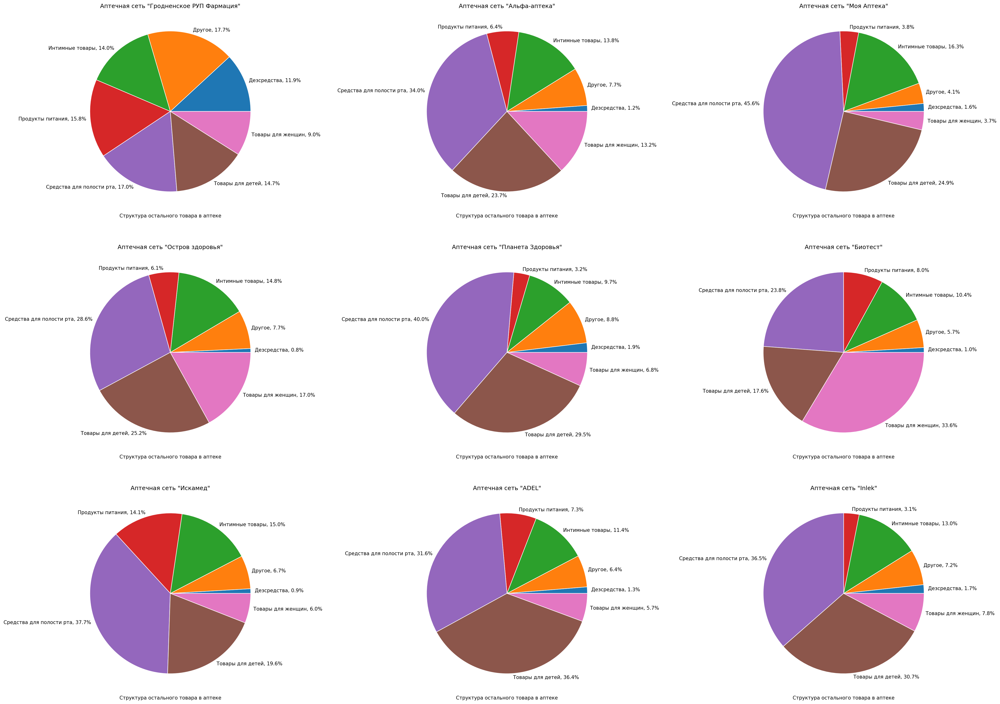

In [26]:
#  дополнительные товары

a = 3  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(30,20), dpi=150)

for i in list_of_top_pharmacies:
    x = group_chain_and_category_other.loc[i].values.flatten()
    labels_without_prct = group_chain_and_category_other.loc[i].index
    size = int(group_chain_and_category_other.loc[i].sum().values)
    sizes = [s/size * 100 for s in x]
    labels = [f'{l}, {s:0.1f}%' for l, s in zip(labels_without_prct, sizes)]
    
    ax = plt.subplot(a, b, c)
    x = group_chain_and_category_other.loc[i].to_numpy().flatten()
    x_index = group_chain_and_category_other.loc[i].index
    plt.pie(x, labels = labels, labeldistance=1.05,  wedgeprops={"edgecolor":"w",'linewidth': 1, 'linestyle': 'solid', 'antialiased': True}, textprops={'fontsize': 10}, normalize=True)
    plt.title(f'Аптечная сеть "{i}"')
    plt.xlabel("Структура остального товара в аптеке")
    #plt.legend(labels_without_prct, loc=2)
    c = c + 1

plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0.2)
plt.show()

### Соотношение различных товарных групп аптечных сетей в виде Donut plot

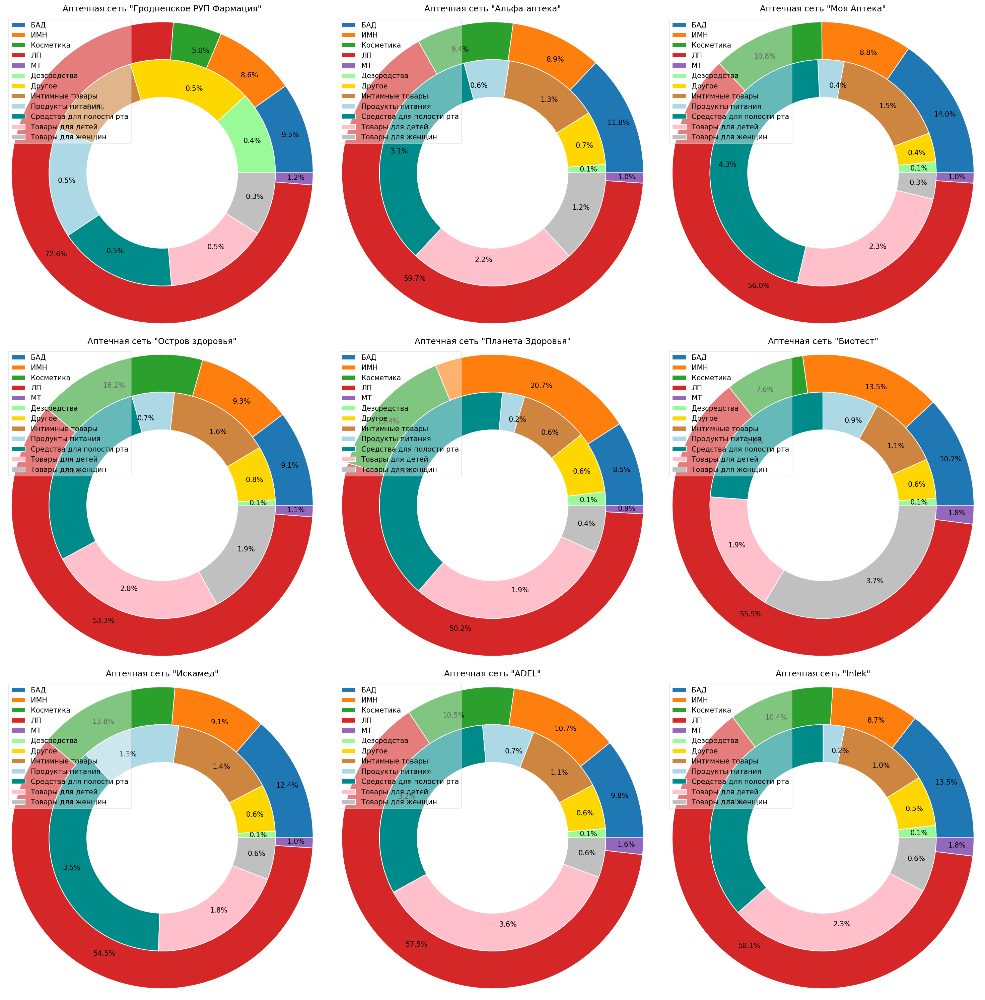

In [27]:
a = 3  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(20,20), dpi=150)

for i in list_of_top_pharmacies:
    size = 0.3
    
    main_cat = group_chain_and_category_main.loc[i].values.flatten()
    add_cat = group_chain_and_category_other.loc[i].values.flatten()
    labels_without_prct = np.append(group_chain_and_category_main.loc[i].index.to_numpy(),group_chain_and_category_other.loc[i].index.to_numpy())
    
    size_within_all_group = int(group_chain_all.loc[i].sum().values)
    
    sizes_of_group_main = [s/size_within_all_group * 100 for s in main_cat]
    labels_main = [f'{s:0.1f}%' for s in sizes_of_group_main]
    
    sizes_of_group_add = [s/size_within_all_group * 100 for s in add_cat]
    labels_add = [f'{s:0.1f}%' for s in sizes_of_group_add]
    
    ax = plt.subplot(a, b, c)
    #colors = [plt.cm.Purples(.25), plt.cm.Purples(.5), plt.cm.Purples(.75),plt.cm.Purples(.99)]
    ax.pie(main_cat, radius=1.2, wedgeprops=dict(width=size, edgecolor='w'), labels=labels_main, labeldistance=0.83)
    colors = ['palegreen', 'gold', 'peru', 'lightblue', 'darkcyan', 'pink', 'silver']
    #colors = [plt.cm.Reds(.14), plt.cm.Reds(.28), plt.cm.Reds(.42),plt.cm.Reds(.56),plt.cm.Reds(.70),plt.cm.Reds(.84),plt.cm.Reds(0.99)]
    ax.pie(add_cat, radius=1.2-size, wedgeprops=dict(width=size, edgecolor='w'), labels=labels_add, labeldistance=0.77, colors=colors)
    
    plt.title(f'Аптечная сеть "{i}"')
    plt.xlabel("Структура товара в аптеке")
    plt.legend(labels_without_prct, loc=2, framealpha=0.4)
    ax.set_axis_off()
    
    c = c + 1
    
plt.tight_layout()
plt.show()

In [28]:
# изменение для следующего плота (изменил локацию МТ)
group_chain_and_category = df_for_pie[df_for_pie.type_of_good.isin(['ЛП', 'БАД', 'ИМН', 'Косметика', 'Остальное'])].groupby(['retail_chain', 'type_of_good']).aggregate({'name_of_medicine' : 'count'}) # для обычного pie
group_chain_and_category_other = df_ph[df_ph.type_of_good.isin(['МТ', 'Средства для полости рта', 'Интимные товары', 'Товары для детей', 'Товары для женщин', 'Продукты питания', 'Дезсредства', 'Другое'])].groupby(['retail_chain', 'type_of_good']).aggregate({'name_of_medicine' : 'count'})

### Соотношение различных товарных групп аптечных сетей в виде круговой диаграммы с выносом столбчатой диаграммы с накоплением.

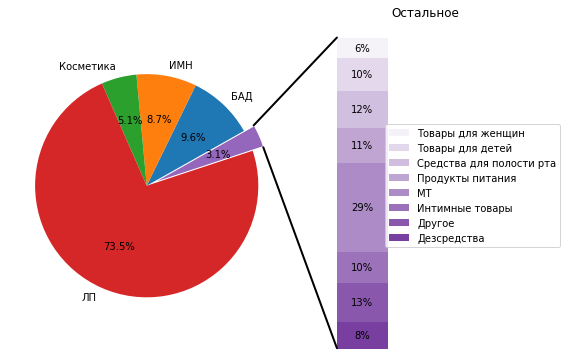

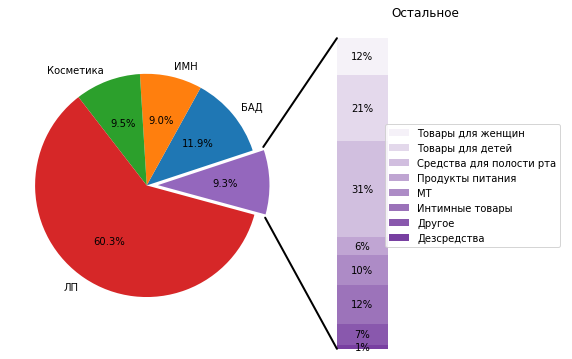

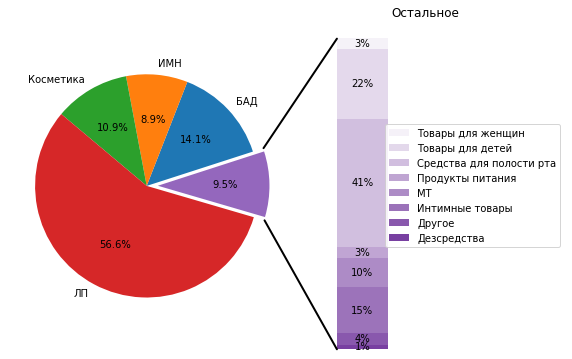

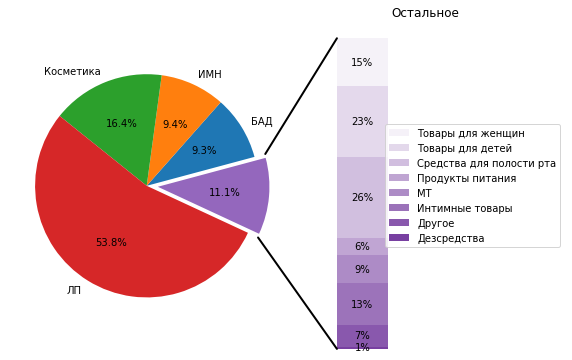

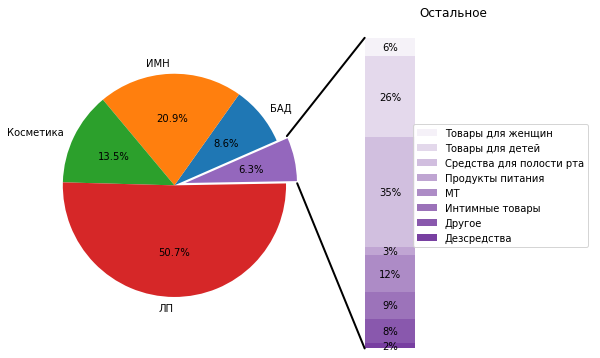

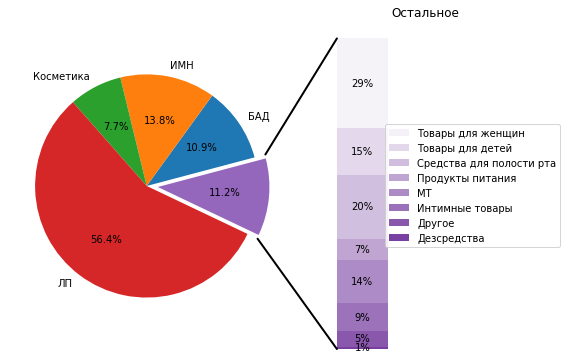

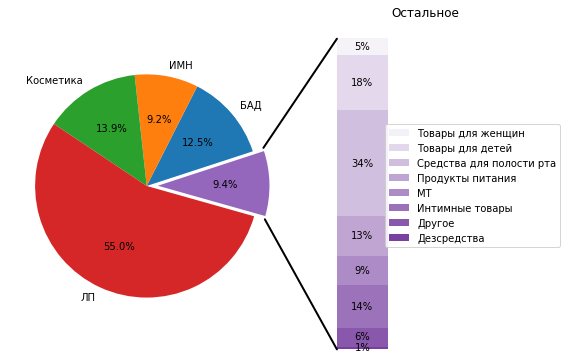

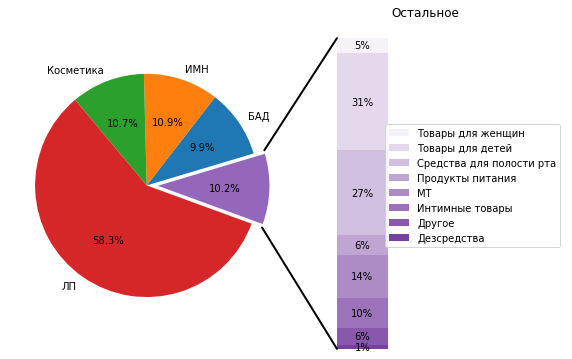

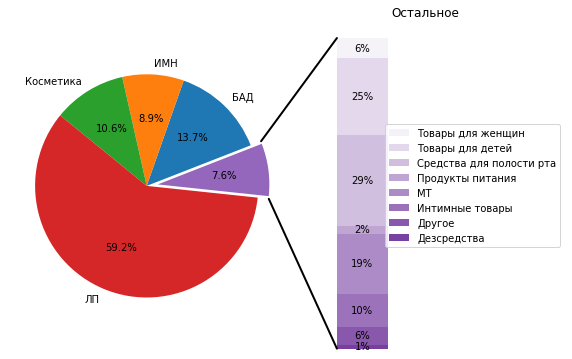

In [29]:
# a = 3  # number of rows
# b = 3  # number of columns
# c = 1  # initialize plot counter

# fig = plt.figure(figsize=(20,20), dpi=150)

for i in list_of_top_pharmacies:
    # make figure and assign axis objects
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))
    fig.subplots_adjust(wspace=0)

    # main
    x_main = group_chain_and_category.loc[i].values.flatten()
    labels_without_prct_main = group_chain_and_category.loc[i].index.values
    labels_without_prct_main[-1] = ''
    size_main = int(group_chain_and_category.loc[i].sum().values)
    sizes_main = [round(s/size_main, 3) for s in x_main]

    # pie chart parameters
    overall_ratios = sizes_main
    labels = labels_without_prct_main
    explode = [0, 0, 0, 0, 0.1]
    # rotate so that first wedge is split by the x-axis
    angle = -180 * overall_ratios[-1] + 35
    wedges, *_ = ax1.pie(overall_ratios, autopct='%1.1f%%', startangle=angle,
                         labels=labels, explode=explode)

    #add
    x_add = group_chain_and_category_other.loc[i].values.flatten()
    labels_without_prct_add = group_chain_and_category_other.loc[i].index
    size_add = int(group_chain_and_category_other.loc[i].sum().values)
    sizes_add = [round(s/size_add, 3) for s in x_add]

    # bar chart parameters
    age_ratios = sizes_add
    age_labels = labels_without_prct_add
    bottom = 1
    width = 1

    # Adding from the top matches the legend.
    for j, (height, label) in enumerate(reversed([*zip(age_ratios, age_labels)])):
        bottom -= height
        #colors = [plt.cm.Reds(.14), plt.cm.Purples(.28), plt.cm.Purples(.42), plt.cm.Purples(.56), plt.cm.Purples(.70), plt.cm.Purples(.84), plt.cm.Purples(.99)]
        bc = ax2.bar(0, height, width, bottom=bottom, color='indigo', label=label ,
                     alpha= 0.05 + 0.1 * j)

        ax2.bar_label(bc, labels=[f"{height:.0%}"], label_type='center')

    ax2.set_title('Остальное')
    ax2.legend(loc='right')
    ax2.axis('off')
    ax2.set_xlim(-1.5 * width, 4 * width)

    # use ConnectionPatch to draw lines between the two plots
    theta1, theta2 = wedges[-1].theta1, wedges[-1].theta2
    center, r = wedges[0].center, wedges[0].r + 0.1
    bar_height = sum(age_ratios)

    # draw top connecting line
    x = r * np.cos(np.pi / 180 * theta2) + center[0]
    y = r * np.sin(np.pi / 180 * theta2) + center[1]
    con = ConnectionPatch(xyA=(-width / 2, bar_height), coordsA=ax2.transData,
                          xyB=(x, y), coordsB=ax1.transData)
    con.set_color([0, 0, 0])
    con.set_linewidth(2)
    ax2.add_artist(con)

    # draw bottom connecting line
    x = r * np.cos(np.pi / 180 * theta1) + center[0]
    y = r * np.sin(np.pi / 180 * theta1) + center[1]
    con = ConnectionPatch(xyA=(-width / 2, 0), coordsA=ax2.transData,
                          xyB=(x, y), coordsB=ax1.transData)
    con.set_color([0, 0, 0])
    ax2.add_artist(con)
    con.set_linewidth(2)
    

plt.show()

#### Наибольшее относительное количество лекарственных препаратов встречается в аптечной сети Гродненское РУП «Фармация», наименьшее – в аптечной сети Планета Здоровья. 
#### C соотношением ИМН обратная ситуация: наибольшее количество встречается в аптечной сети Планета Здоровья, наименьшее – в аптечной сети Гродненское РУП «Фармация», это объясняется тем, что в группу ИМН были включены очки, большой ассортимент которых встречается в аптеках Планета здоровья.

#### Наибольшее количество БАДов представлено в аптечной сети Моя аптека, наименьшее – в аптечной сети Планета здоровья.

#### Большое количество косметических средств представлено в аптечных сетях Остров здоровья, Искамед, Планета Здоровья, наименьшее – в аптечной сети – Гродненское РУП «Фармация».

### Соотношение лекарственных препаратов по стране производства

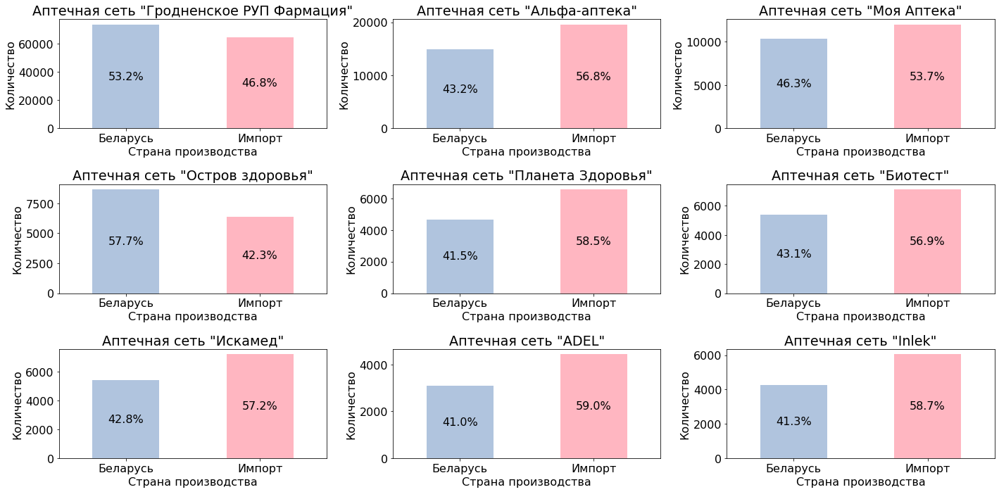

In [30]:
plt.rcParams.update({'font.size': 16})

group_chain_and_country_of_prod = df_ph[df_ph.is_medicine == 1].groupby(['retail_chain', 'is_import']).aggregate({'name_of_medicine' : 'count'})

#  Categorical Data
a = 3  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(20, 10))

for i in list_of_top_pharmacies:
    ax = plt.subplot(a, b, c)
    sum_of_values = int(group_chain_and_country_of_prod.loc[i].sum())
    group = group_chain_and_country_of_prod.loc[i].reset_index()
    labels = [f'{(i/sum_of_values) * 100:.1f}%' for i in group.name_of_medicine.values]
    
    group.plot.bar(x='is_import', y='name_of_medicine', color=['lightsteelblue', 'lightpink'], ax=ax)
    sum_of_values = int(group_chain_and_country_of_prod.loc[i].sum())
    plt.title(f'Аптечная сеть "{i}"')
    plt.xlabel("Страна производства")
    plt.ylabel("Количество")
    plt.xticks([0, 1], ['Беларусь', 'Импорт'], rotation = 0)
    ax.get_legend().remove()
    ax.bar_label(ax.containers[0], labels, label_type='center')

    c = c + 1

plt.tight_layout()
plt.show()

#### В аптечных сетях Гродненское РУП «Фармация» и Остров здоровья относительное количество лекарственных средств белорусского производства преобладает над относительным количеством лекарственных средств зарубежного производства. В остальных аптечных сетях ситуация обратная.

### Соотношение лекарственных препаратов по порядку отпуска

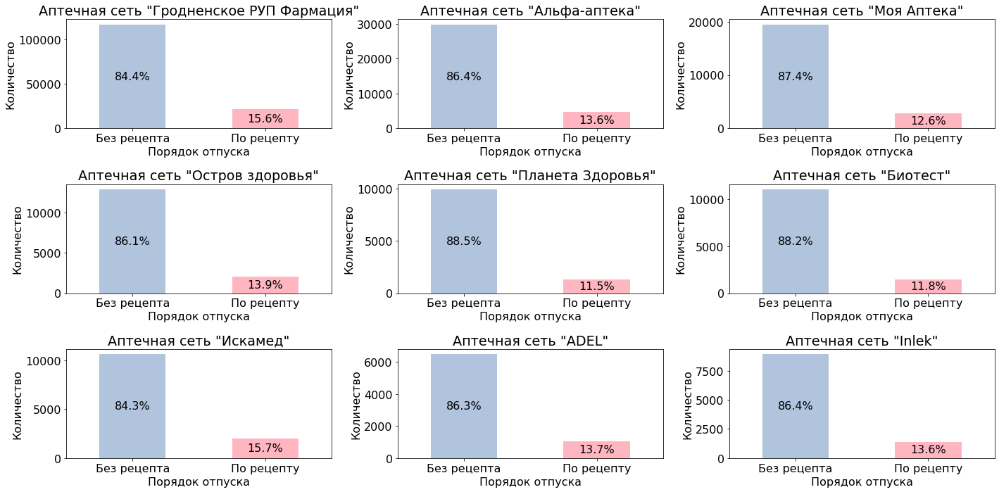

In [31]:
# количество ЛП по аптечной сети, по рецепту
group_chain_and_prescribed = df_ph[(df_ph.is_medicine == 1)].groupby(['retail_chain', 'is_prescribed']).aggregate({'name_of_medicine' : 'count'})

#  Categorical Data
a = 3  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(20, 10))

for i in list_of_top_pharmacies:
    ax = plt.subplot(a, b, c)
    sum_of_values = int(group_chain_and_prescribed.loc[i].sum())
    group = group_chain_and_prescribed.loc[i].reset_index()
    labels = [f'{(i/sum_of_values) * 100:.1f}%' for i in group.name_of_medicine.values]
    
    group.plot.bar(x='is_prescribed', y='name_of_medicine', color=['lightsteelblue', 'lightpink'], ax=ax)
    plt.title(f'Аптечная сеть "{i}"')
    plt.xlabel("Порядок отпуска")
    plt.ylabel("Количество")
    plt.xticks(ticks=[0,1], labels = ['Без рецепта', 'По рецепту'], rotation = 0)
    ax.get_legend().remove()
    ax.bar_label(ax.containers[0], labels, label_type='center')

    c = c + 1
    
plt.tight_layout()
plt.show()

#### Относительное количество рецептурных лекарственных средств наибольшее у аптечной сети Искамед, следующей аптечной сетью по количеству рецептурных ЛС идет Гродненское РУП «Фармация».
#### Наименьшее количество рецептурных ЛС представлено у аптечной сети Планета здоровья.

### Распределение лекарственных препаратов по ценам среди аптечных сетей:

In [32]:
f=lambda x: x/x.sum() * 100
stat_of_price = df_ph.loc[(df_ph.is_medicine == 1) & (df_ph.retail_chain.isin(list_of_top_pharmacies)), ['name_of_medicine', 'retail_chain', 'category_of_price']]
#stat_of_price['category_of_price'] = pd.Categorical(stat_of_price['category_of_price'], ['lowest', 'low', 'medium', 'high'])
stat_of_price_with_digits = stat_of_price.copy(deep=True)
stat_of_price_with_digits['category_of_price'] = stat_of_price_with_digits['category_of_price'].map({'lowest':0, 'low':1, 'below_average':2, 'average':3, 'above_average':4, 'highest':5})

stat_of_price_with_perc = stat_of_price_with_digits.groupby(['retail_chain','category_of_price'])\
    .agg({'category_of_price':'value_counts'}).groupby(level=0).apply(f).sort_index().droplevel(1)\
    .rename({'category_of_price':'perc_of_group'}, axis=1).reset_index()

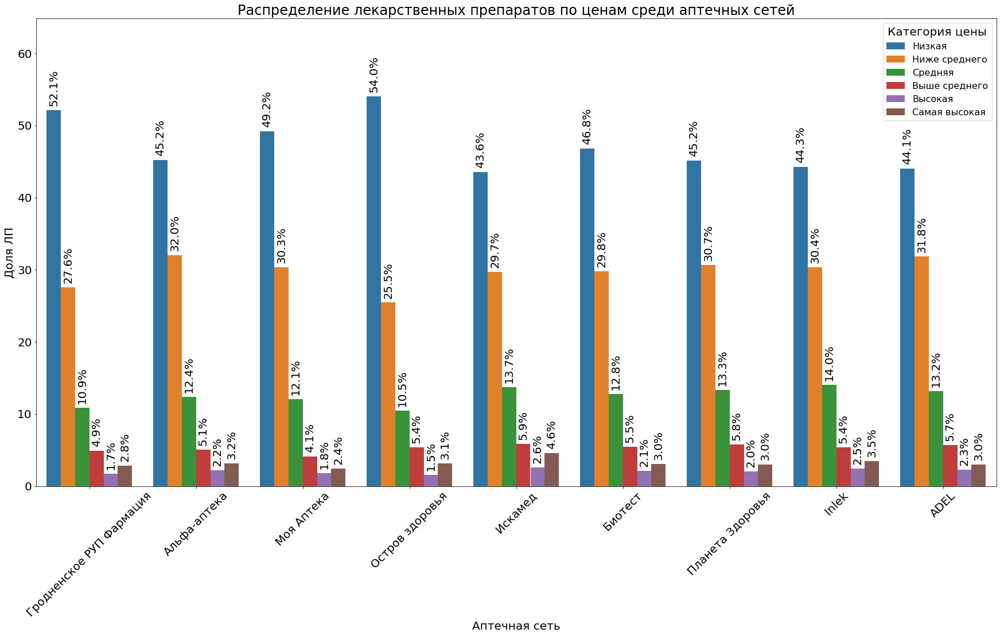

In [33]:
# категории цен на лп по аптекам плюс беларусь импорт
plt.rcParams.update({'font.size': 20})

groups = stat_of_price_with_digits.retail_chain.value_counts().index.to_numpy()
hue_type = stat_of_price_with_digits['category_of_price'].dtype.type
proportions = stat_of_price_with_digits.groupby('retail_chain')['category_of_price'].value_counts(normalize=True)

fig = plt.figure(figsize=(30, 15))
ax = sns.barplot(data=stat_of_price_with_perc, x='retail_chain', y='perc_of_group', hue='category_of_price', order=groups)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
ax.set_xlabel('Аптечная сеть')
ax.set_ylabel('Доля ЛП')
ax.set_title('Распределение лекарственных препаратов по ценам среди аптечных сетей')
h, l = ax.get_legend_handles_labels()
ax.legend(h, ['Низкая', 'Ниже среднего', 'Средняя', 'Выше среднего', 'Высокая', 'Самая высокая'], 
          title='Категория цены', prop={'size': 16})

for c in ax.containers:
    labels = [f'{proportions.loc[g, hue_type(c.get_label())]:.1%}' for g in groups]
    ax.bar_label(c, labels, rotation=90, padding = 7)

ax.margins(y=0.2)

### Распределение лекарственных препаратов по ценам среди аптечных сетей в виде donut plot

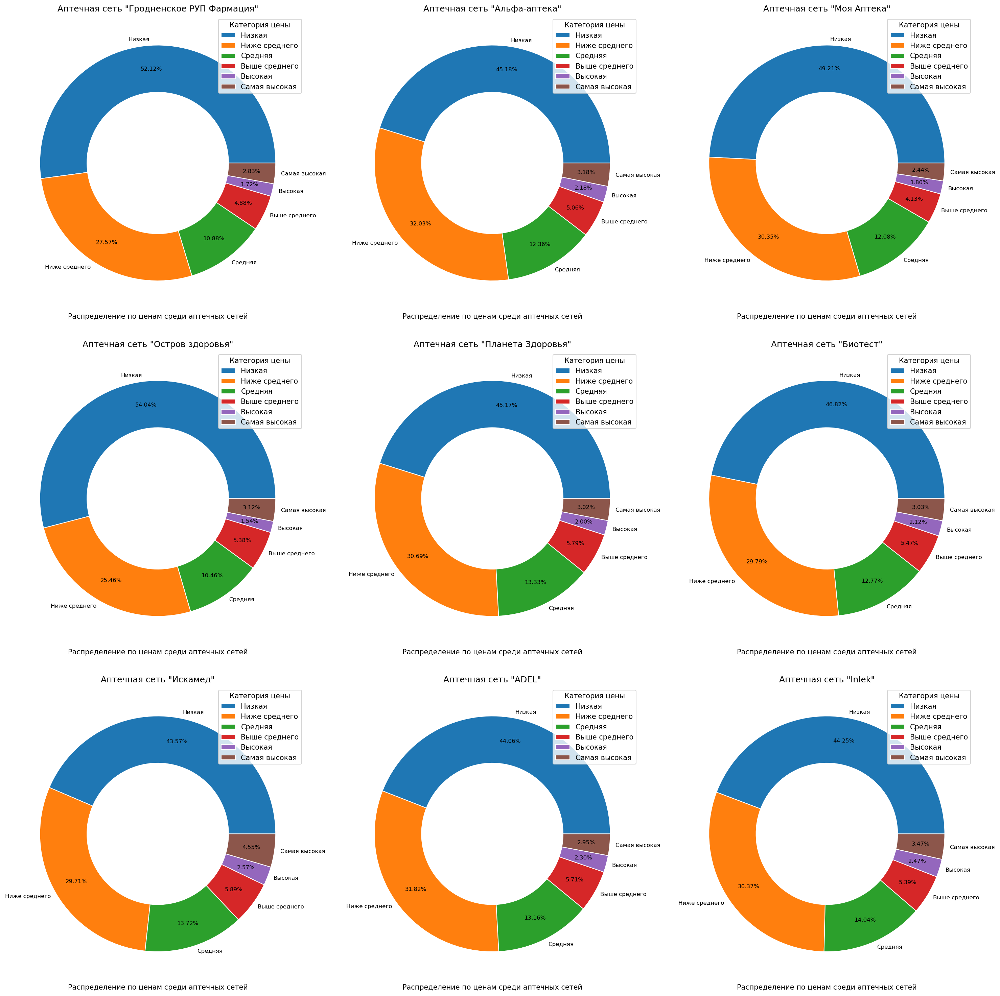

In [34]:
stat_of_price2 = stat_of_price_with_digits.groupby(['retail_chain', 'category_of_price']).count()

plt.rcParams.update({'font.size': 10})

#  Categorical Data
a = 3  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(20,20), dpi=150)

for i in list_of_top_pharmacies:
    labels = ['Низкая', 'Ниже среднего', 'Средняя', 'Выше среднего', 'Высокая', 'Самая высокая']
    
    ax = plt.subplot(a, b, c)
    x = stat_of_price2.loc[i].to_numpy().flatten()
    x_index = stat_of_price2.loc[i].index
    plt.pie(x, labels = labels, labeldistance=1.05,  wedgeprops={"edgecolor":"w",'linewidth': 1, 'linestyle': 'solid', 'antialiased': True, 'width':0.4}, 
            textprops={'fontsize': 8}, normalize=True, autopct='%.2f%%', pctdistance=0.8, rotatelabels=False)
    plt.title(f'Аптечная сеть "{i}"')
    plt.legend(labels, title='Категория цены', loc='best')
    plt.xlabel('Распределение по ценам среди аптечных сетей')
    c = c + 1


plt.tight_layout()
plt.show()

#### Наибольшее относительное количество ЛС низкой ценовой категории встречается в аптечной сети Остров здоровья, наименьшее – в аптечной сети Искамед.
#### Наибольшее относительное количество ЛС ценовой категории «ниже среднего» встречается в аптечной сети Альфа-аптека, наименьшее – в аптечной сети Остров Здоровья.
#### Наибольшее относительное количество ЛС средней ценовой категории встречается в аптечной сети Inlek, наименьшее – в аптечной сети Остров Здоровья.
#### Наибольшее относительное количество ЛС ценовой категории «выше среднего» встречается в аптечной сети Искамед, наименьшее – в аптечной сети Моя аптека.
#### Наибольшее относительное количество ЛС высокой ценовой категории встречается в аптечной сети Искамед, наименьшее – в аптечной сети Остро Здоровья.
#### Наибольшее относительное количество ЛС ценовой категории «самая высокая» встречается в аптечной сети Искамед, наименьшее – в аптечной сети Моя аптека.

### Распределение средних цен различных ценовых категорий среди  аптечных сетей:

In [35]:
# лекарства в опр. ЛФ и с опр. произв., которые есть в каждой аптечной сети из топ сетей
chain_and_prices = df_ph.loc[(df_ph.is_medicine == 1) & (df_ph.retail_chain.isin(list_of_top_pharmacies)), ['retail_chain', 'price_of_medicine', 'category_of_price', 'is_import']]
chain_and_prices['category_of_price'] = chain_and_prices['category_of_price'].map({'lowest':0, 'low':1, 'below_average':2, 'average':3, 'above_average':4, 'highest':5})

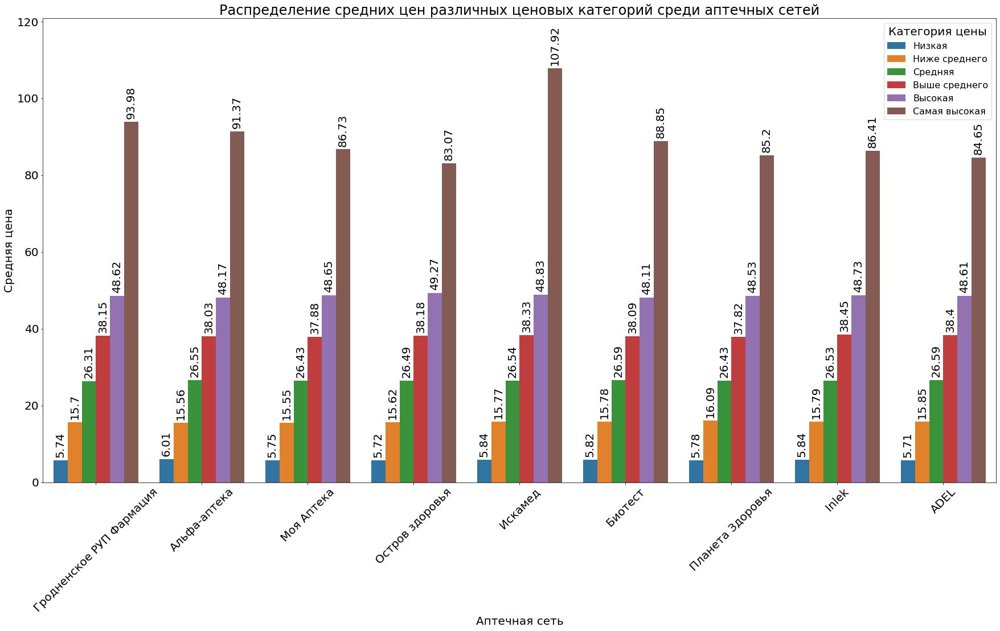

In [36]:
chain_and_prices_for_bar = chain_and_prices.groupby(['retail_chain', 'category_of_price']).aggregate({'price_of_medicine':np.mean})\
    .rename(columns={'price_of_medicine':'mean_price_of_medicine'}).reset_index()
chain_and_prices_for_bar.mean_price_of_medicine = chain_and_prices_for_bar.mean_price_of_medicine.round(2)

plt.rcParams.update({'font.size': 20})

fig = plt.figure(figsize=(30, 15))
ax = sns.barplot(data=chain_and_prices_for_bar, x='retail_chain', y='mean_price_of_medicine', hue='category_of_price', order=groups)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
ax.set_xlabel('Аптечная сеть')
ax.set_ylabel('Средняя цена')
ax.set_title('Распределение средних цен различных ценовых категорий среди аптечных сетей')
h, l = ax.get_legend_handles_labels()
ax.legend(h, ['Низкая', 'Ниже среднего', 'Средняя', 'Выше среднего', 'Высокая', 'Самая высокая'], 
          title='Категория цены', prop={'size': 16})

for c in ax.containers:
    ax.bar_label(c, rotation=90, padding =5)

ax.margins(y=0.12)

#### Из диаграммы видно, что наименее низкие средние цены в категории «низкая» принадлежат аптечной сети ADEL, самые высокие в той же категории – аптечной сети Альфа-аптека. 
#### Самые низкие цены в средней категории наблюдаются у аптек сети Гродненское РУП «Фармация», самые высокие у аптек сети ADEL.
#### Анализируя категорию цены «самая высокая» можно придти к выводу, что наиболее низкие цены данной категории у аптечной сети Остров здоровья, самые высокие у аптечной сети Искамед.

### Распределение средних цен различных ценовых категорий среди аптечных сетей в разрезе страны производства

In [37]:
chain_and_prices_for_bar = chain_and_prices.groupby(['retail_chain', 'category_of_price', 'is_import']).aggregate({'price_of_medicine':np.mean})\
    .rename(columns={'price_of_medicine':'mean_price_of_medicine'}).reset_index().sort_values('is_import', ascending=True)
chain_and_prices_for_bar['divided_mean_price_of_medicine'] = chain_and_prices_for_bar.mean_price_of_medicine.apply(lambda x: x/2).round(2)
chain_and_prices_for_bar.mean_price_of_medicine = chain_and_prices_for_bar.mean_price_of_medicine.round(2)
chain_and_prices_for_bar.is_import = chain_and_prices_for_bar.is_import.map({0:'Беларусь', 1:'Импорт'})
chain_and_prices_for_bar.category_of_price = chain_and_prices_for_bar.category_of_price.map({0: 'Низкая', 1:'Ниже среднего', 2:'Средняя', 3:'Выше среднего', 4:'Высокая', 5:'Самая высокая'})
#chain_and_prices_for_bar

In [38]:
df_to_write = chain_and_prices_for_bar.loc[:,['retail_chain', 'category_of_price', 'is_import', 'mean_price_of_medicine']].sort_values('retail_chain')
df_to_write.to_csv('podpisi.csv', encoding='windows-1251')

In [39]:
chart = alt.Chart(chain_and_prices_for_bar, title='Распределение средних цен различных ценовых категорий среди аптечных сетей в разрезе страны производства').mark_bar().encode(
    x=alt.X('category_of_price:N', stack='zero', sort=['Низкая', 'Ниже среднего', 'Средняя', 'Выше среднего', 'Высокая', 'Самая высокая'], title=None, axis=alt.Axis(labelAngle=-45, labelOverlap=False)),
    y=alt.Y('mean_price_of_medicine:Q', axis=alt.Axis(grid=False, title='Суммарная средняя цена'), scale=alt.Scale(domain=[0, 201], bins=[i for i in range(211) if i%10 ==0])),
    #column=alt.Column('retail_chain:N', title=None, sort=list_of_top_pharmacies, header=alt.Header(labelFontSize=11, labelFontStyle='bold')),
    order=alt.Order(
      'is_import:Q', sort='ascending'),
    color=alt.Color('is_import:N', scale=alt.Scale(range=['#96ceb4', '#ffcc5c']),
        legend=alt.Legend(title='Страна производства'))
    ).properties(
        width=100,
        height=600)

#chart = chart.configure_view(strokeOpacity=0)
chart.configure_title(fontSize=18, anchor='middle', align='center', dy=-10)
    
text = alt.Chart(chain_and_prices_for_bar).mark_text(dx=-1, dy=2, color='black', align='center', baseline='bottom', angle=270).encode(
    x=alt.X('category_of_price:N', stack='zero', sort=['Низкая', 'Ниже среднего', 'Средняя', 'Выше среднего', 'Высокая', 'Самая высокая'], title=None, axis=alt.Axis(labelAngle=-45, labelOverlap=False)),
    y=alt.Y('mean_price_of_medicine:Q'),
    detail='retail_chain:N')
    #text=alt.Text('mean_price_of_medicine:Q', format='.2f'))

alt.layer(
    chart, text, data=chain_and_prices_for_bar).facet(
    facet=alt.Column('retail_chain:N', title=None, sort=list_of_top_pharmacies, header=alt.Header(labelFontSize=11, labelFontStyle='bold')),
).configure_view(continuousHeight=200, continuousWidth= 0.5).configure_facet(spacing=0.5)


alt.FacetChart(...)

### Распределение средних цен по стране производства среди всех аптек

[Text(0, 0, 'Низкая'),
 Text(1, 0, 'Ниже среднего'),
 Text(2, 0, 'Средняя'),
 Text(3, 0, 'Выше среднего'),
 Text(4, 0, 'Высокая'),
 Text(5, 0, 'Самая высокая')]

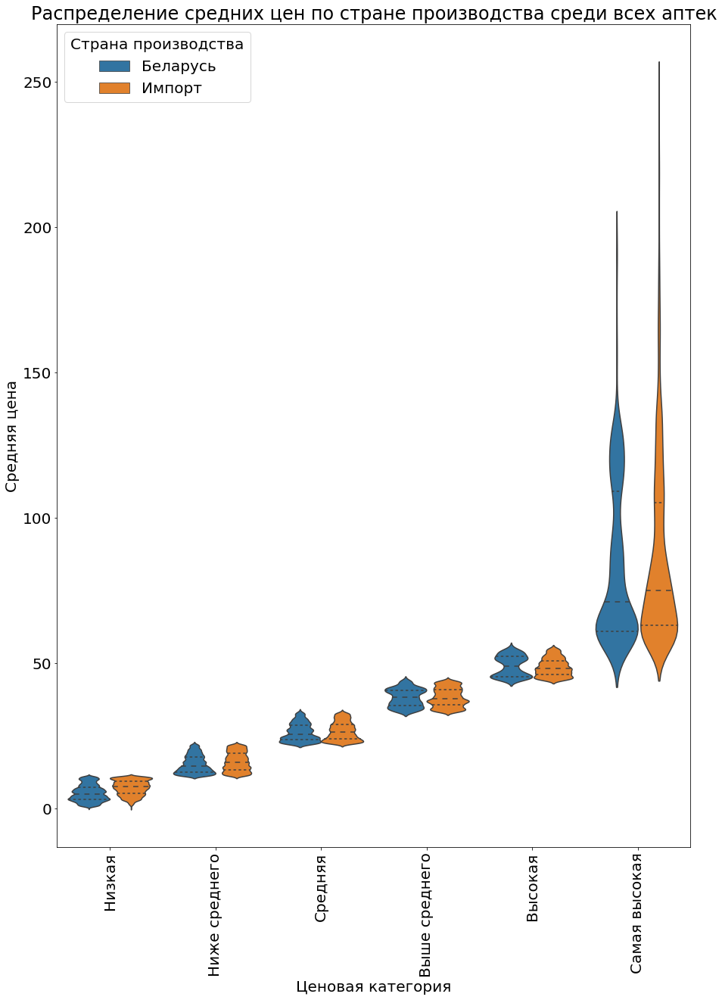

In [40]:
fig = plt.figure(figsize=(15, 20))

ax = sns.violinplot(data = chain_and_prices[(chain_and_prices['price_of_medicine'] < 250)], 
                    x='category_of_price', y='price_of_medicine', hue='is_import', inner="quartile")
ax.set_xlabel('Ценовая категория')
ax.set_ylabel('Средняя цена')
ax.set_title('Распределение средних цен по стране производства среди всех аптек')
h, l = ax.get_legend_handles_labels()
ax.legend(h, ['Беларусь', 'Импорт'], title = 'Страна производства', loc=2)
ax.set_xticklabels(['Низкая', 'Ниже среднего', 'Средняя', 'Выше среднего', 'Высокая', 'Самая высокая'], rotation=90)


### Распределение средних цен по стране производства среди каждой аптеки

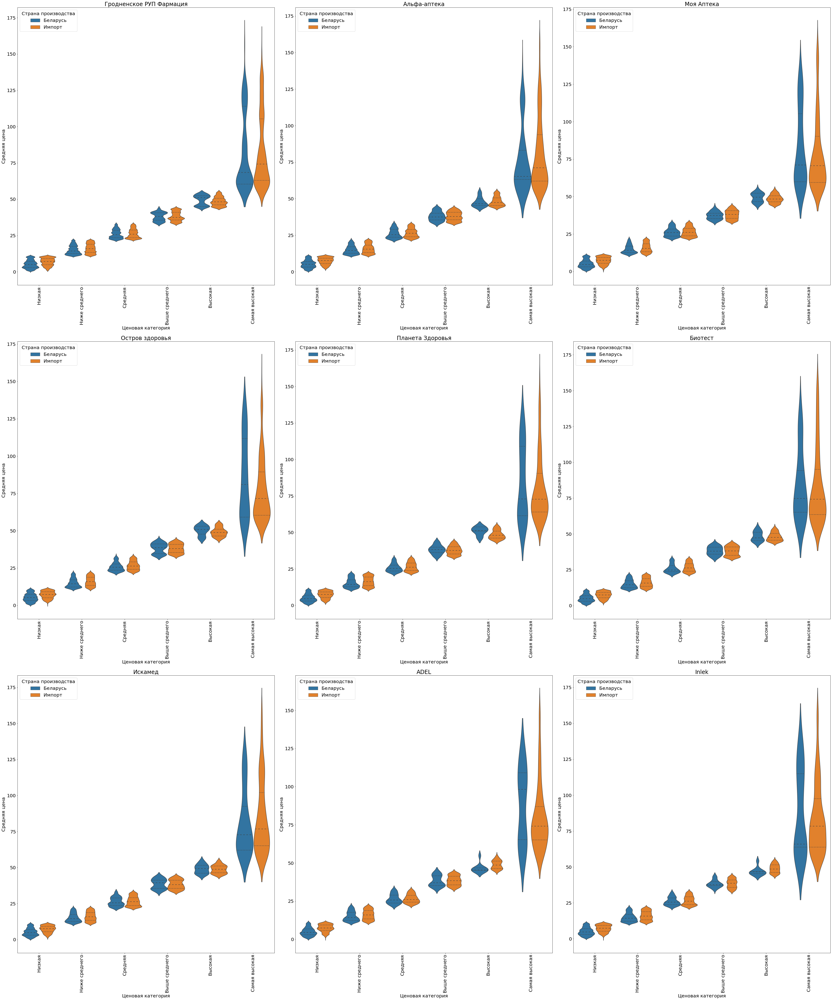

In [41]:
# распределение средних цен, макс цену поставил 

a = 3  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(50, 60))

for i in list_of_top_pharmacies:
    ax = plt.subplot(a, b, c)
    ax = sns.violinplot(data = chain_and_prices[(chain_and_prices['retail_chain']==i) & (chain_and_prices['price_of_medicine'] < 160)], 
                        x='category_of_price', y='price_of_medicine', hue='is_import', inner="quartile")
    ax.set_xlabel('Ценовая категория')
    ax.set_ylabel('Средняя цена')
    ax.set_title(i)
    h, l = ax.get_legend_handles_labels()
    ax.legend(h, ['Беларусь', 'Импорт'], title = 'Страна производства', loc=2)
    ax.set_xticklabels(['Низкая', 'Ниже среднего', 'Средняя', 'Выше среднего', 'Высокая', 'Самая высокая'], rotation=90)
    c = c + 1
    
plt.tight_layout()
plt.show()

In [42]:
# ch_and_pr = df_ph.loc[(df_ph.is_medicine == 1) & (df_ph.retail_chain.isin(list_of_top_pharmacies)), ['retail_chain', 'price_of_medicine', 'category_of_price']]
# # {'lowest':0, 'low':1, 'below_average':2, 'average':3, 'above_average':4, 'highest':5}
# lowest, low, below_average, average, above_average, highest = [], [], [], [], [], []

# for i in list_of_top_pharmacies:
#     lowest.append(ch_and_pr.loc[(ch_and_pr.retail_chain == i) & (ch_and_pr.category_of_price == 'lowest'), 'price_of_medicine'].to_numpy())
#     low.append(ch_and_pr.loc[(ch_and_pr.retail_chain == i) & (ch_and_pr.category_of_price == 'low'), 'price_of_medicine'].to_numpy())
#     below_average.append(ch_and_pr.loc[(ch_and_pr.retail_chain == i) & (ch_and_pr.category_of_price == 'below_average'), 'price_of_medicine'].to_numpy())
#     average.append(ch_and_pr.loc[(ch_and_pr.retail_chain == i) & (ch_and_pr.category_of_price == 'average'), 'price_of_medicine'].to_numpy())
#     above_average.append(ch_and_pr.loc[(ch_and_pr.retail_chain == i) & (ch_and_pr.category_of_price == 'above_average'), 'price_of_medicine'].to_numpy())
#     highest.append(ch_and_pr.loc[(ch_and_pr.retail_chain == i) & (ch_and_pr.category_of_price == 'highest'), 'price_of_medicine'].to_numpy())

### Распределение медианных цен различных ценовых категорий среди аптечных сетей

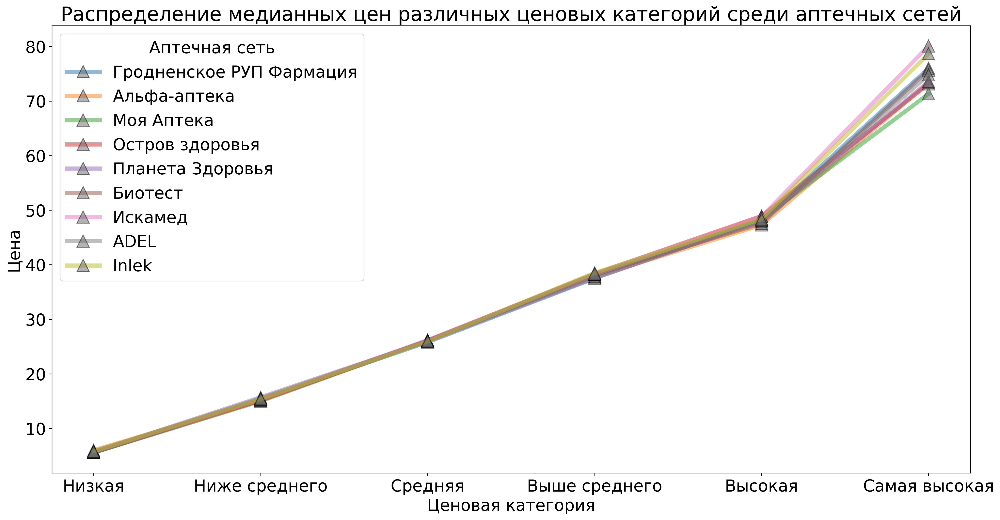

In [43]:

chain_and_prices_for_plot = chain_and_prices.groupby(['retail_chain', 'category_of_price']).aggregate({'price_of_medicine':np.median}).rename(columns={'price_of_medicine':'median_price_of_medicine'})
fig = plt.figure(figsize=(20, 10), dpi=300)
for i in list_of_top_pharmacies:
    ax = plt.plot(chain_and_prices_for_plot.loc[i].median_price_of_medicine, linestyle='-', linewidth=5, alpha=0.5, 
                  marker='^', markeredgecolor='black', markeredgewidth=1, markerfacecolor='dimgrey', markersize=15)
    plt.title('Распределение медианных цен различных ценовых категорий среди аптечных сетей')
    plt.xlabel('Ценовая категория')
    plt.ylabel('Цена')
    plt.legend(list_of_top_pharmacies, title='Аптечная сеть')
    plt.xticks(range(6),['Низкая', 'Ниже среднего', 'Средняя', 'Выше среднего', 'Высокая', 'Самая высокая'])

#### Различие между медианными ценами разных аптечных сетей начинает проявляться только в высокой категории цены, существенная разница есть только в категории цены «самая высокая».
#### Так, в категории «самая высокая» цена наибольшее значение наблюдается у аптечной сети Искамед, это можно объяснить тем, что у аптек данной сети относительное количество ЛС в данной категории цен выше, чем у других. 
#### Менее обоснована высокая медианная цена у аптечной сети Inlek.
#### Наименьшее значение медианной цены в данной ценовой категории наблюдается у аптечной сети Моя аптека. Медианная цена аптечной сети Гродненское РУП «Фармация» находится посередине относительно других аптечных сетей.
#### При сравнении средних цен разных ценовых категорий различия еще больше нивелируются.

### Распределение средних цен на различные группы товаров среди разных аптечных сетей

In [69]:
goods_and_prices = df_ph.loc[df_ph.retail_chain.isin(list_of_top_pharmacies), ['name_of_medicine', 'type_of_good', 'retail_chain', 'price_of_medicine']]\
    .groupby(['type_of_good', 'retail_chain']).aggregate({'price_of_medicine' : 'mean'}).rename(columns={'price_of_medicine':'mean_price_of_good'}).reset_index()
goods_and_prices.mean_price_of_good = goods_and_prices.mean_price_of_good.round(2)

goods_and_prices.loc[(goods_and_prices.type_of_good.isin(['Средства для полости рта', 'Интимные товары', 'Товары для детей', 'Товары для женщин', 'Продукты питания', 'Дезсредства', 'Другое'])), ['type_of_good']] = 'Остальное'
order_of_goods_and_prices = ['ЛП', 'БАД', 'ИМН', 'МТ', 'Косметика', 'Остальное']
goods_and_prices

,type_of_good,retail_chain,mean_price_of_good
0,БАД,ADEL,21.95
1,БАД,Inlek,22.75
2,БАД,Альфа-аптека,21.10
3,БАД,Биотест,19.09
4,БАД,Гродненское РУП Фармация,14.68
...,...,...,...
103,Остальное,Гродненское РУП Фармация,9.12
104,Остальное,Искамед,9.18
105,Остальное,Моя Аптека,7.21
106,Остальное,Остров здоровья,10.18


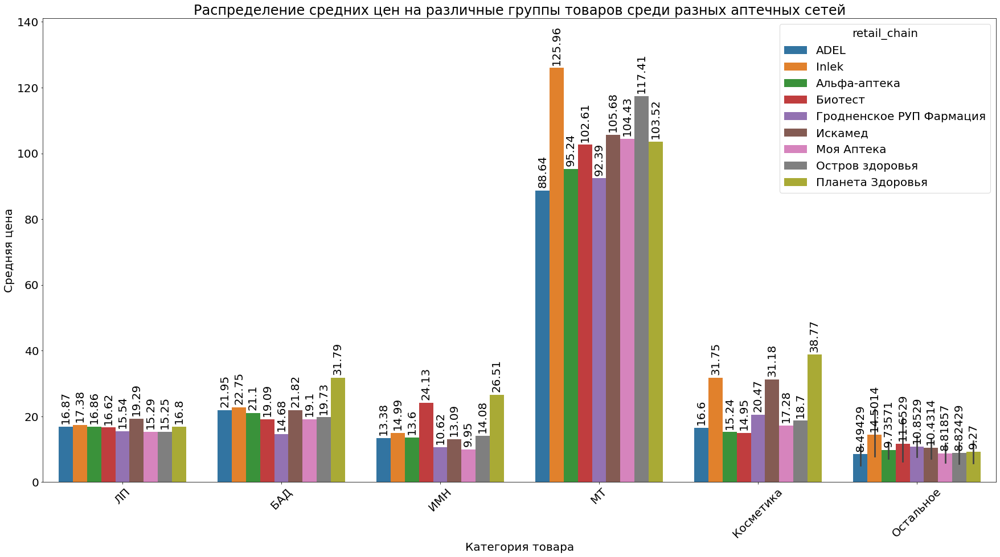

In [70]:
fig = plt.figure(figsize=(30, 15))
ax = sns.barplot(data=goods_and_prices, x='type_of_good', y='mean_price_of_good', hue='retail_chain', order=order_of_goods_and_prices)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
ax.set_xlabel('Категория товара')
ax.set_ylabel('Средняя цена')
ax.set_title('Распределение средних цен на различные группы товаров среди разных аптечных сетей')
h, l = ax.get_legend_handles_labels()

for c in ax.containers:
    ax.bar_label(c, rotation=90, padding =5)

ax.margins(y=0.12)

#### Наиболее высокие цены среди БАДов, ИМН, косметики принадлежат аптечной сети Планета Здоровья, аптечная сеть Inlek имеет самые высокие средние цены на МТ, аптечной сети Искамед принадлежит самая высокая средняя цена на ЛП

#### Самая низкая средняя цена на ЛП - у аптечной сети Остров здоровья.  Среди БАДов самая низкая средняя цена у Гродненского РУП Фармация. На ИМН самая низкая средняя цена у аптечной сети Моя Аптека, на МТ - ADEL, на косметику - Биотест